<a href="https://colab.research.google.com/github/kk221/AllWomenTech_Projects/blob/Cookie_Dataton/Dataton_Cookies.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![alt text](https://media.giphy.com/media/1iXObbKyXYlpe/giphy.gif)

# Load the Data

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.datasets.samples_generator import make_blobs, make_circles, make_moons
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import silhouette_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.datasets.samples_generator module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
# Load the data
! pip install pydrive                             # Package to use Google Drive API - not installed in Colab VM by default
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth                    # Other necessary packages
from oauth2client.client import GoogleCredentials
auth.authenticate_user()                         # Follow prompt in the authorization process
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()

In [ ]:
drive = GoogleDrive(gauth)
data = drive.CreateFile({'id': '18-kh9CPW8S6b6f0eV5PWDpr8dfeT-jcA'})   # "your_module_file_id" is the part after "id=" in the shareable link 

data.GetContentFile('cookies.csv')                        # Save the module file to Colab VM
# csv : https://drive.google.com/open?id=18-kh9CPW8S6b6f0eV5PWDpr8dfeT-jcA

dataset = 'cookies.csv'
df_original = pd.read_csv(dataset)


# Preprocessing

## df_original Info

In [ ]:
# Info of original dataset - df_original
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5198 entries, 0 to 5197
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sugar to flour ratio  5198 non-null   float64
 1   sugar index           5193 non-null   float64
 2   bake temp             5198 non-null   int64  
 3   chill time            5198 non-null   float64
 4   calories              5198 non-null   float64
 5   density               5198 non-null   float64
 6   pH                    5198 non-null   float64
 7   grams baking soda     5198 non-null   float64
 8   bake time             5188 non-null   float64
 9   quality               5198 non-null   int64  
 10  butter type           5198 non-null   object 
 11  weight                5198 non-null   float64
 12  diameter              5198 non-null   int64  
 13  mixins                5196 non-null   object 
 14  crunch factor         5198 non-null   float64
 15  aesthetic appeal     

In [ ]:
# df_original dataframe
df_original.head()

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,diameter,mixins,crunch factor,aesthetic appeal
0,0.25,9.5,300,15.0,136.0,0.99367,8.10,0.44,12.1,8,melted,15.2,7,raisins,1.30,3
1,0.23,3.3,520,34.0,113.0,0.99429,8.16,0.48,8.4,7,melted,12.4,7,raisins,1.71,3
2,0.18,1.9,360,33.0,106.0,0.98746,8.21,0.83,14.0,9,melted,9.4,7,"nuts, chocolate",1.78,3
3,0.18,10.5,490,41.0,124.0,0.99630,8.14,0.35,10.5,7,melted,12.2,7,chocolate,1.59,3
4,0.24,2.4,770,6.0,33.0,0.99740,8.09,0.57,9.4,5,cubed,19.8,7,"nuts, oats, chocolate",1.30,3


In [ ]:
# Checking unusual values
df_original.describe(include='all')

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,diameter,mixins,crunch factor,aesthetic appeal
count,5198.000000,5193.000000,5198.000000,5198.000000,5198.000000,5198.000000,5198.000000,5198.000000,5188.000000,5198.000000,5198,5198.000000,5198.0,5196,5198.000000,5198.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,NaN,13,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,melted,NaN,NaN,chocolate,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3920,NaN,NaN,1893,NaN,NaN
mean,0.318049,5.402465,559.638322,30.390246,115.015294,0.995819,8.222020,0.530864,10.494758,7.325125,NaN,14.381935,7.0,NaN,1.499367,3.000577
std,0.150036,4.668342,353.274062,17.268403,56.506171,0.062193,0.283323,0.150886,1.194584,1.302780,NaN,3.023740,0.0,NaN,0.289205,0.024019
min,0.000000,0.600000,90.000000,0.000000,-99.000000,0.987110,7.720000,0.220000,8.000000,3.000000,NaN,-99.000000,7.0,NaN,1.000000,3.000000
25%,0.240000,1.800000,380.000000,17.000000,76.000000,0.992300,8.110000,0.430000,9.500000,7.000000,NaN,12.800000,7.0,NaN,1.250000,3.000000
50%,0.310000,3.000000,470.000000,29.000000,118.000000,0.994800,8.210000,0.505000,10.300000,8.000000,NaN,14.000000,7.0,NaN,1.500000,3.000000
75%,0.390000,8.000000,640.000000,41.000000,155.000000,0.996908,8.320000,0.600000,11.300000,8.000000,NaN,15.400000,7.0,NaN,1.750000,3.000000


In [ ]:
# Checking target value - Quality
df_original.quality.value_counts

<bound method IndexOpsMixin.value_counts of 0       8
1       7
2       9
3       7
4       5
       ..
5193    6
5194    8
5195    7
5196    8
5197    5
Name: quality, Length: 5198, dtype: int64>

### Null Values

In [ ]:
# % of null values
total = df_original.isnull().sum().sort_values(ascending=False)
percent = (df_original.isnull().sum()/df_original.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
bake time,10,0.001924
sugar index,5,0.000962
mixins,2,0.000385
aesthetic appeal,0,0.000000
crunch factor,0,0.000000
diameter,0,0.000000
weight,0,0.000000
butter type,0,0.000000
quality,0,0.000000
grams baking soda,0,0.000000


In [ ]:
# % of null values
# http://theprofessionalspoint.blogspot.com/2019/03/visualize-missing-values-in-bar-plot.html

missing_values = df_original.isnull().sum() / len(df_original) *100
missing_values = missing_values[missing_values > 0]
missing_values.sort_values(inplace=True)
missing_values

mixins         0.038476
sugar index    0.096191
bake time      0.192382
dtype: float64

In [ ]:
# % of null values

missing_values = missing_values.to_frame()
missing_values.columns = ['Percentage']
missing_values.index.names = ['Feature Names']
missing_values['Feature Names'] = missing_values.index

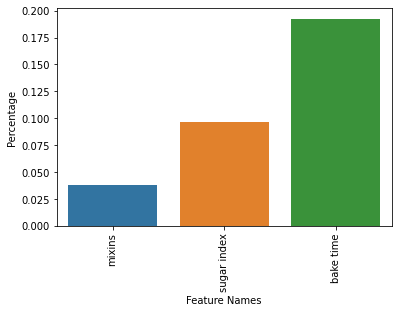

In [ ]:
# % of null values - barplot

#sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'Feature Names', y = 'Percentage', data=missing_values)
plt.xticks(rotation = 90)
plt.show()

### Duplicated Values

In [ ]:
# checking duplicated values
df_original.duplicated().sum()

12

In [ ]:
# feature Diameter only has one value - 7
df_original['diameter'].unique()

array([7])

In [ ]:
# duplicated value dataframe
dup_values = df_original[df_original.duplicated()]
dup_values

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,diameter,mixins,crunch factor,aesthetic appeal
3259,0.29,10.5,400,21.0,145.0,0.99660,8.04,0.35,9.4,7,melted,15.2,7,raisins,1.06,3
3413,0.13,4.5,390,17.0,116.0,0.99070,8.42,0.90,13.7,9,melted,11.2,7,"nuts, chocolate",1.82,3
3424,0.45,8.3,500,52.0,196.0,0.99550,8.18,0.48,9.5,7,melted,12.8,7,chocolate,1.55,3
3754,0.00,1.8,500,27.0,63.0,0.99160,8.68,0.79,14.0,6,cubed,10.4,7,raisins,1.92,3
3863,0.43,1.6,350,31.0,128.0,0.99160,8.10,0.50,12.3,8,melted,16.4,7,chocolate,1.05,3
3930,0.32,3.6,350,22.0,93.0,0.99144,8.08,0.60,12.5,9,melted,15.2,7,raisins,1.82,3
4035,0.30,12.8,620,19.0,171.0,0.99808,8.00,0.52,9.0,9,melted,13.6,7,"chocolate, oats",1.39,3
4378,0.30,1.6,450,36.0,139.0,0.99534,8.11,0.49,9.3,7,melted,18.8,7,chocolate,1.92,3
4599,0.42,12.0,670,24.0,131.0,0.99727,8.19,0.34,9.3,7,melted,13.8,7,"nuts, oats, chocolate",1.27,3
4760,0.35,15.3,560,31.0,117.0,0.99980,8.27,0.50,9.6,7,melted,15.4,7,chocolate,1.26,3


In [ ]:
# from duplicated value dataframe, "aa" only has one value 3
dup_values["aesthetic appeal"].value_counts()/len(dup_values)

3    1.0
Name: aesthetic appeal, dtype: float64

After analyzing the original dataset, this is a Classification Problem with multiple classes.

> Two classes: Good vs Bad cookies

> Three classes: Bad - Good - Great cookies

> Nine (Original) classes: 3-11 levels of cookies



# EDA

## df - dropna and replaced

In [ ]:
# Drop null values
# mixins         0.038476
# sugar index    0.096191
# bake time      0.192382

df = df_original.copy()
df.dropna(axis=0, inplace=True)


In [ ]:
# Classification problem


df['quality'] = df['quality'].astype('category') # Dtype target variable 
df['aesthetic appeal'] = df['aesthetic appeal'].astype('category') # only two values 3 and 4, treat as categorical feature

df.info() # No null values

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5181 entries, 0 to 5197
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   sugar to flour ratio  5181 non-null   float64 
 1   sugar index           5181 non-null   float64 
 2   bake temp             5181 non-null   int64   
 3   chill time            5181 non-null   float64 
 4   calories              5181 non-null   float64 
 5   density               5181 non-null   float64 
 6   pH                    5181 non-null   float64 
 7   grams baking soda     5181 non-null   float64 
 8   bake time             5181 non-null   float64 
 9   quality               5181 non-null   category
 10  butter type           5181 non-null   object  
 11  weight                5181 non-null   float64 
 12  diameter              5181 non-null   int64   
 13  mixins                5181 non-null   object  
 14  crunch factor         5181 non-null   float64 
 15  aest

### Dealing with Bad Values

In [ ]:
# Num features vs Cat features

cat_features = []
num_features = []

for i in df:
    if df[i].dtype == 'object' or df[i].dtype.name == 'category':
        cat_features.append(i)
        
    elif df[i].dtype == 'int64' or df[i].dtype == 'float64':
        num_features.append(i)
       
        
print( "cat_features = ", cat_features)
print("num_features = ", num_features)

cat_features =  ['quality', 'butter type', 'mixins', 'aesthetic appeal']
num_features =  ['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time', 'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight', 'diameter', 'crunch factor']


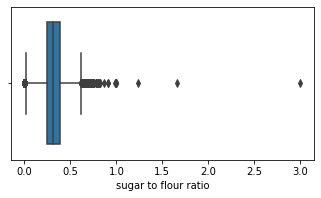

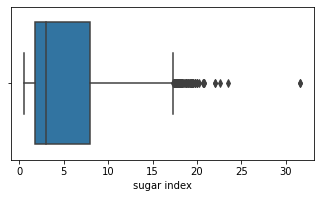

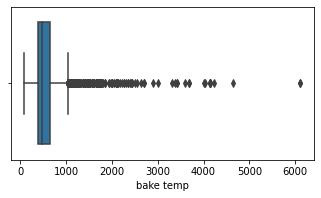

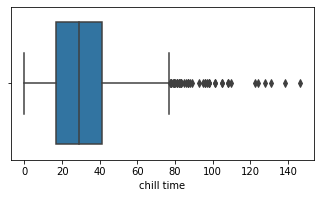

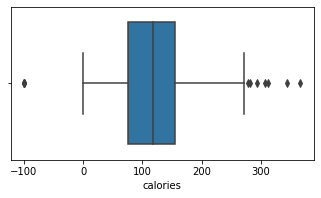

...

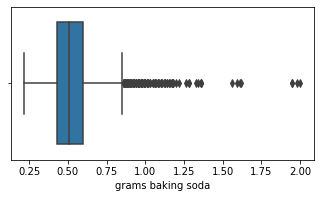

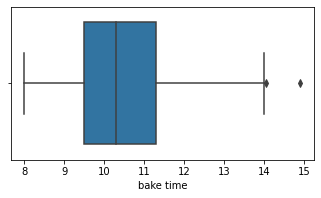

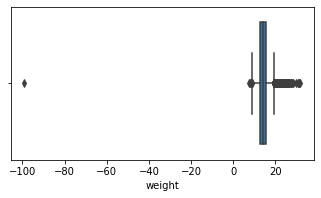

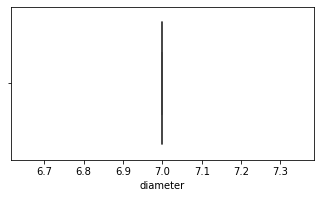

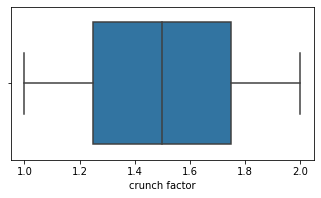

In [ ]:
# Boxplot to analyse each num feature

for col in num_features:
  n=1
  _ = plt.figure(figsize=(25,40))
  _ = plt.subplot(12,4,n)
  _ = sns.boxplot(x = col, data=df)
  n = n+1

Abnomal data values in 

- bake temp
- density
- weight
- diameter
- PH
- calories


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)


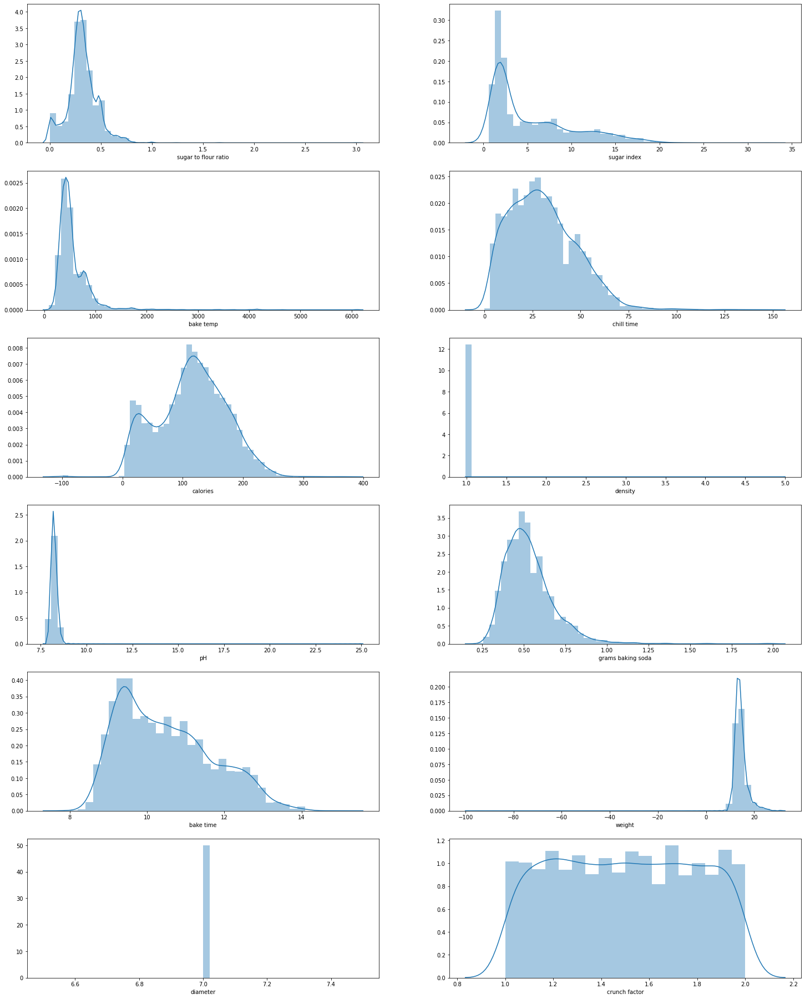

In [ ]:
# Distribution of numerical values 
column_list = df[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
    _ = plt.subplot(11,2,n)
    _ = sns.distplot(column_list[col])
    #_ = plt.title(col)
    n = n+1

In [ ]:
# There is only one value in Diameter, won't affect target, drop the whole column
#num_features.remove('diameter')
df=df.drop(['diameter'], axis=1)

In [ ]:
# Replace bad values with column mean, didn't change the distribution

df["weight"].replace({-99: df['weight'].mean()}, inplace=True)
df["calories"].replace({-99: df['calories'].mean()}, inplace=True)
df["pH"].replace({25: df['pH'].mean()}, inplace=True)

In [ ]:
# Num features vs Cat features

cat_features = []
num_features = []

for i in df:
    if df[i].dtype == 'object' or df[i].dtype.name == 'category':
        cat_features.append(i)
        
    elif df[i].dtype == 'int64' or df[i].dtype == 'float64':
        num_features.append(i)
       
        
print( "cat_features = ", cat_features)
print("num_features = ", num_features)

cat_features =  ['quality', 'butter type', 'mixins', 'aesthetic appeal']
num_features =  ['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time', 'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight', 'crunch factor']


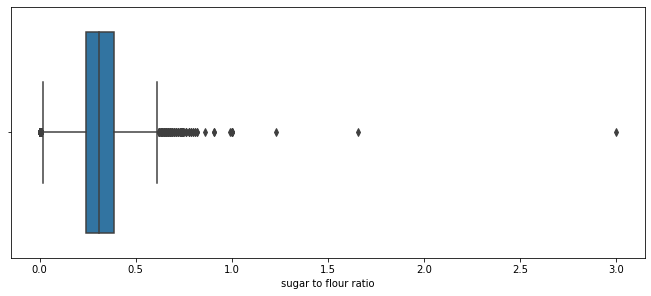

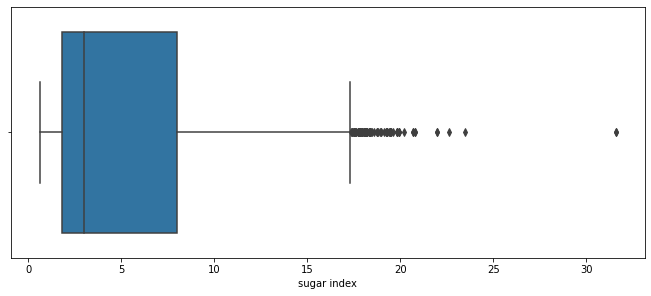

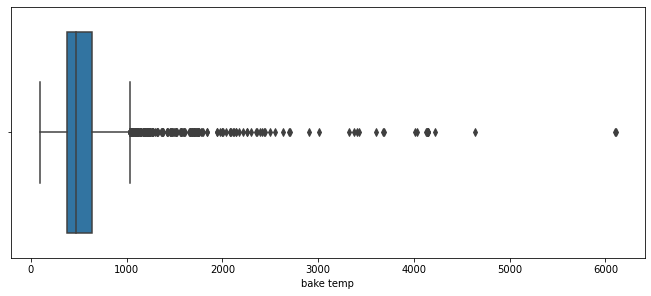

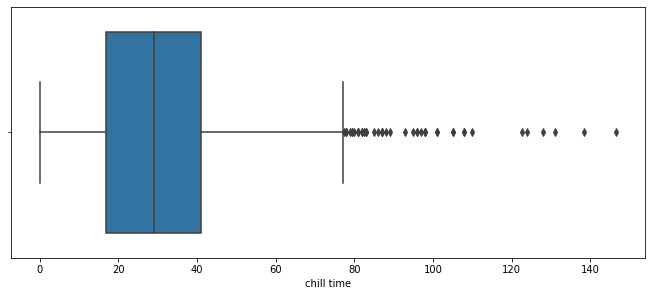

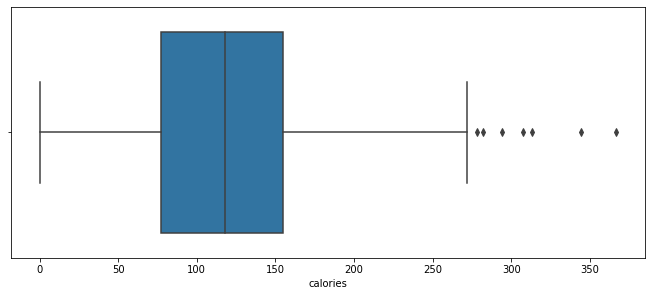

...

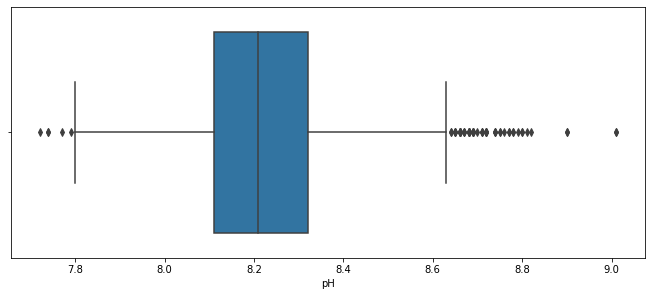

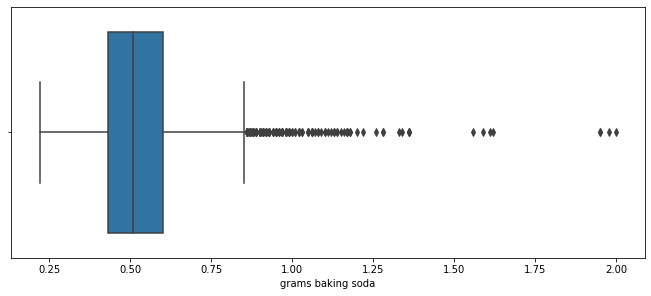

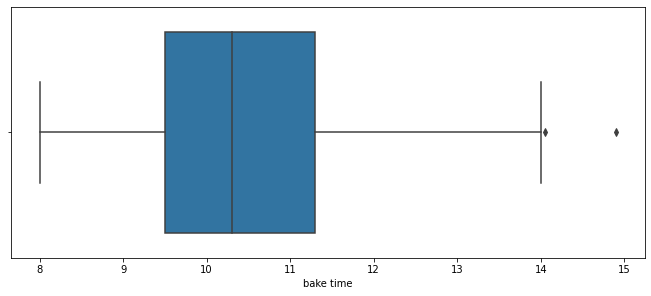

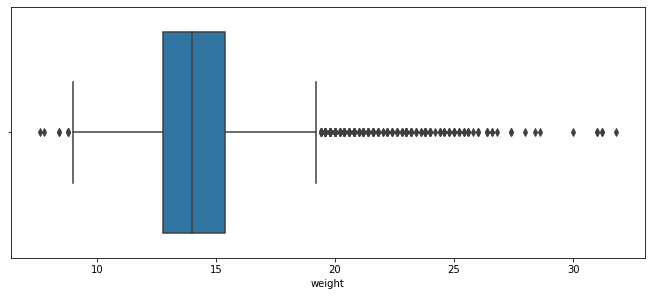

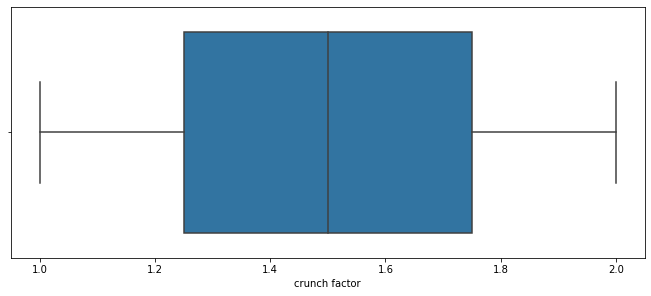

In [ ]:
for col in num_features:
  n=1
  _ = plt.figure(figsize=(25,60))
  _ = plt.subplot(11,2,n)
  _ = sns.boxplot(x = col, data=df)
  n = n+1

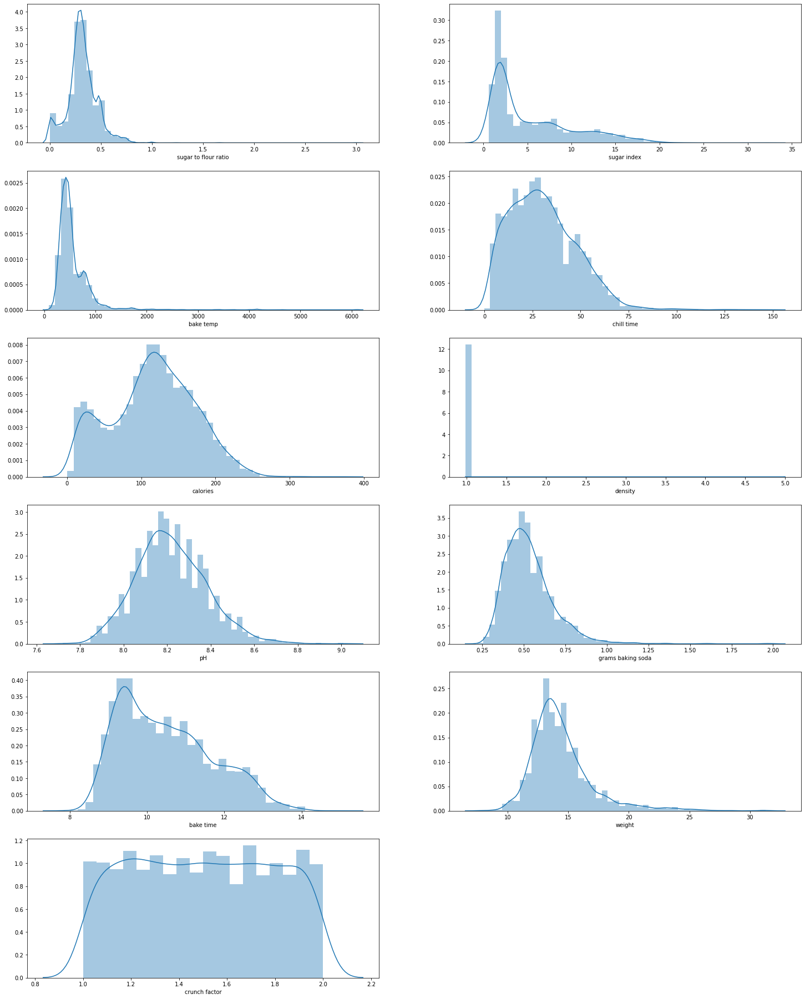

In [ ]:
# Distribution of numerical values 
column_list = df[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
    _ = plt.subplot(11,2,n)
    _ = sns.distplot(column_list[col])
    #_ = plt.title(col)
    n = n+1

In [ ]:
df['grams baking soda']

0       0.44
1       0.48
2       0.83
3       0.35
4       0.57
        ... 
5193    0.60
5194    0.44
5195    0.37
5196    0.78
5197    0.66
Name: grams baking soda, Length: 5181, dtype: float64

### df1 - bake temp >500 dropped

In [ ]:
# After checking the highest baking temperature, 500F is the max. 
# 30% of the total values 
df1 = df.copy()

In [ ]:
df1.drop(df1.loc[df1['bake temp'] > 500].index, inplace=True)
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3032 entries, 0 to 5195
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   sugar to flour ratio  3032 non-null   float64 
 1   sugar index           3032 non-null   float64 
 2   bake temp             3032 non-null   int64   
 3   chill time            3032 non-null   float64 
 4   calories              3032 non-null   float64 
 5   density               3032 non-null   float64 
 6   pH                    3032 non-null   float64 
 7   grams baking soda     3032 non-null   float64 
 8   bake time             3032 non-null   float64 
 9   quality               3032 non-null   category
 10  butter type           3032 non-null   object  
 11  weight                3032 non-null   float64 
 12  mixins                3032 non-null   object  
 13  crunch factor         3032 non-null   float64 
 14  aesthetic appeal      3032 non-null   category
dtypes: c

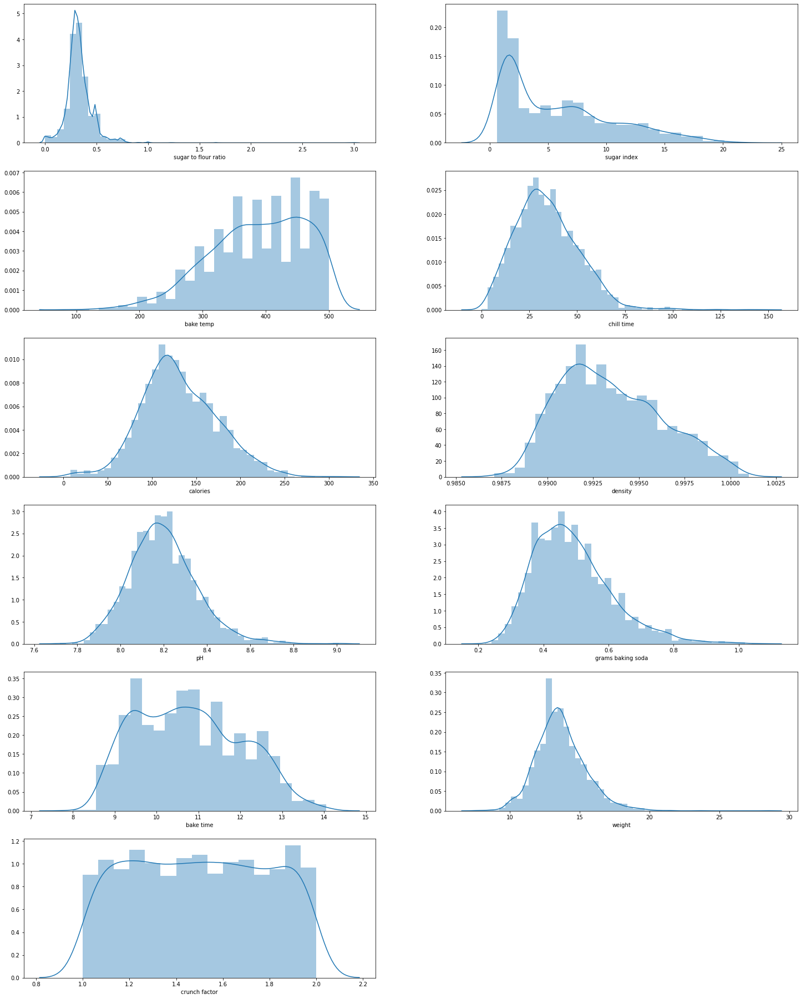

In [ ]:
# Distribution of numerical values 
column_list = df1[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
    _ = plt.subplot(11,2,n)
    _ = sns.distplot(column_list[col])
    #_ = plt.title(col)
    n = n+1

In [ ]:
df1.columns.value_counts().sum()

15

In [ ]:
#df1.groupby(['quality','butter type']).count()

##### Target orignial

###### Study Target 

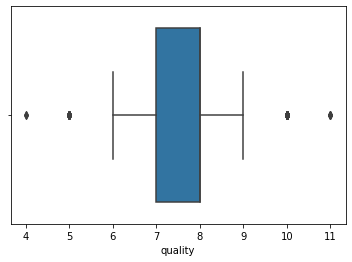

In [ ]:
# target: Boxplot
_ = sns.boxplot(x=df1["quality"])

In [ ]:
target_study = (df1['quality'].value_counts() / len(df1['quality']) *100).to_frame()
target_study.columns = ['percentage']
target_study.index.names = ['Quality']
target_study['Quality'] = target_study.index

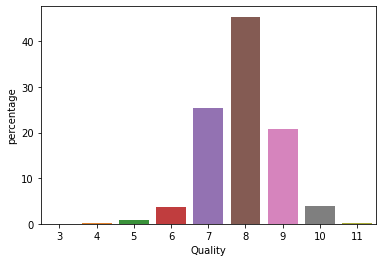

In [ ]:
sns.barplot(x = 'Quality', y = 'percentage', data=target_study)
#plt.xticks(rotation = 90)
plt.show()

###### Cat vs Target 

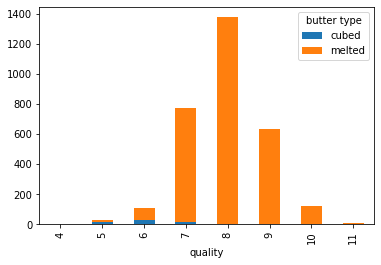

In [ ]:
# cat feature - Butter Type vs target - Quality (value)
# https://stackoverflow.com/questions/43544694/using-pandas-crosstab-with-seaborn-stacked-barplots


ct1 = pd.crosstab(df1.quality, df1['butter type'])

ct1.plot.bar(stacked=True)
plt.legend(title='butter type')

plt.show()

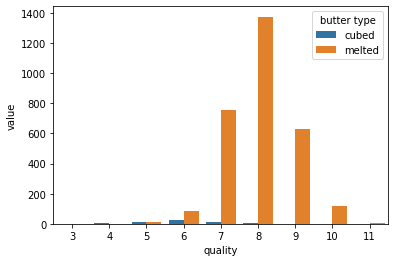

In [ ]:
 # now stack and reset
 stacked = ct1.stack().reset_index().rename(columns={0:'value'})

 # plot grouped bar chart
 sns.barplot(x=stacked.quality, y=stacked.value, hue=stacked['butter type'])

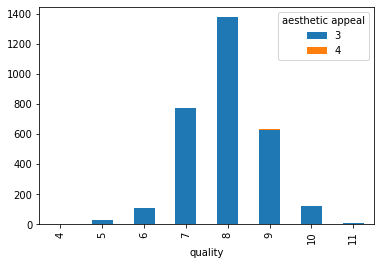

In [ ]:
# cat feature - aesthetic appeal vs target - Quality (value)
ct2 = pd.crosstab(df1.quality, df1['aesthetic appeal'])

ct2.plot.bar(stacked=True)
plt.legend(title='aesthetic appeal')

plt.show()

In [ ]:
cat_features

['quality', 'butter type', 'mixins', 'aesthetic appeal']

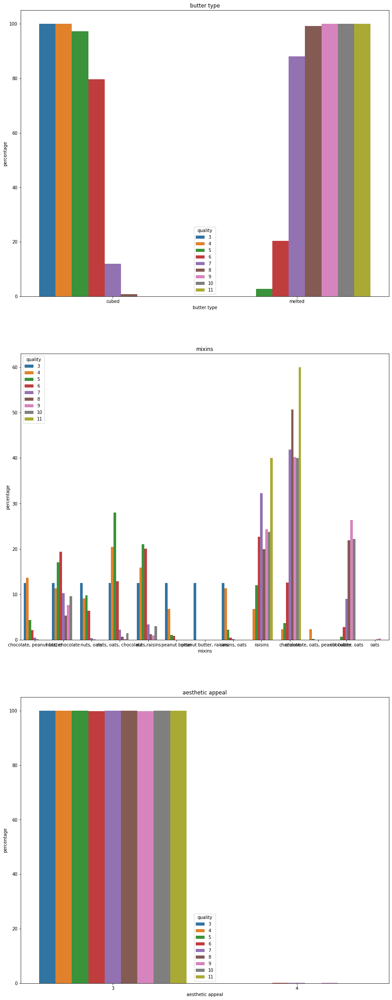

In [ ]:
# % cat features vs target

_=plt.figure(figsize=(15,55))
n=1
for col in df[cat_features].columns:
    if col == 'quality':
        continue
    if df[col].nunique() < 100:
        values=(df.groupby(['quality'])[col]
                     .value_counts(normalize=True, dropna=False)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
        _ = plt.subplot(4,1,n)
        _ = sns.barplot(x=col, y="percentage", hue="quality", data=values)
        _ = plt.title(col)
        n= n+1

Aesthetic appeal doesn't have impact on orignial target

###### Num vs Target

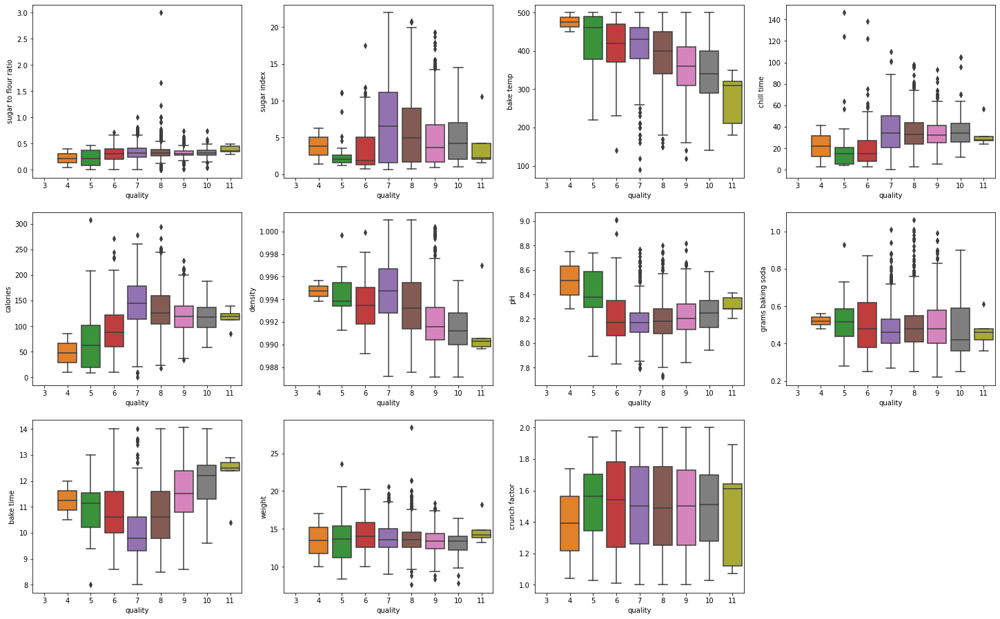

In [ ]:
# Boxplot of numerical values  vs Target - quality 
column_list = df1[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
  var = 'quality'
  data = pd.concat([column_list[col], df1[var]], axis=1)
  _ = plt.subplot(11,4,n)
  _ = sns.boxplot(x=var, y =column_list[col], data=data )
  #_ = plt.title(col)
  n = n+1

> Good cookies have higher Calories

> Good cookies with low Bake Temp

> Good cookies have longer Chill Time


##### Target encoded: 2

Bad cookies vs Good cookies

In [ ]:
# Creating classes of target with dropping high temp rows

def encode_units(x):
    if (3 <= x <= 7):
        return 0
    if (8 <= x <= 11):
        return 1
df1['quality_coded'] = df1['quality'].apply(encode_units)

In [ ]:
df1.columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time',
       'quality', 'butter type', 'weight', 'mixins', 'crunch factor',
       'aesthetic appeal', 'quality_coded'],
      dtype='object')

###### Study Target encoded

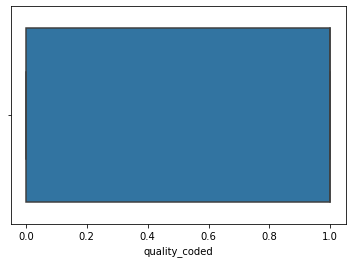

In [ ]:
# target: Boxplot
_ = sns.boxplot(x=df1["quality_coded"])

In [ ]:
# % of each class in the target

target_study_encoded = (df1['quality_coded'].value_counts() / len(df1['quality_coded']) *100).to_frame()
target_study_encoded.columns = ['percentage']
target_study_encoded.index.names = ['Quality Encoded']
target_study_encoded['Quality Encoded'] = target_study_encoded.index


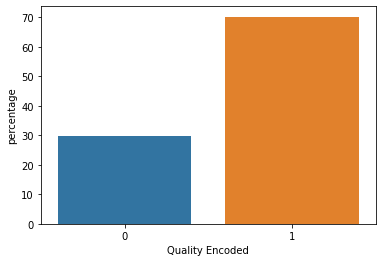

In [ ]:
# barplot % of each class in the target

sns.barplot(x ='Quality Encoded', y = 'percentage', data=target_study_encoded)
#plt.xticks(rotation = 90)
plt.show()

Imbalanced target

###### Cat vs Target encoded

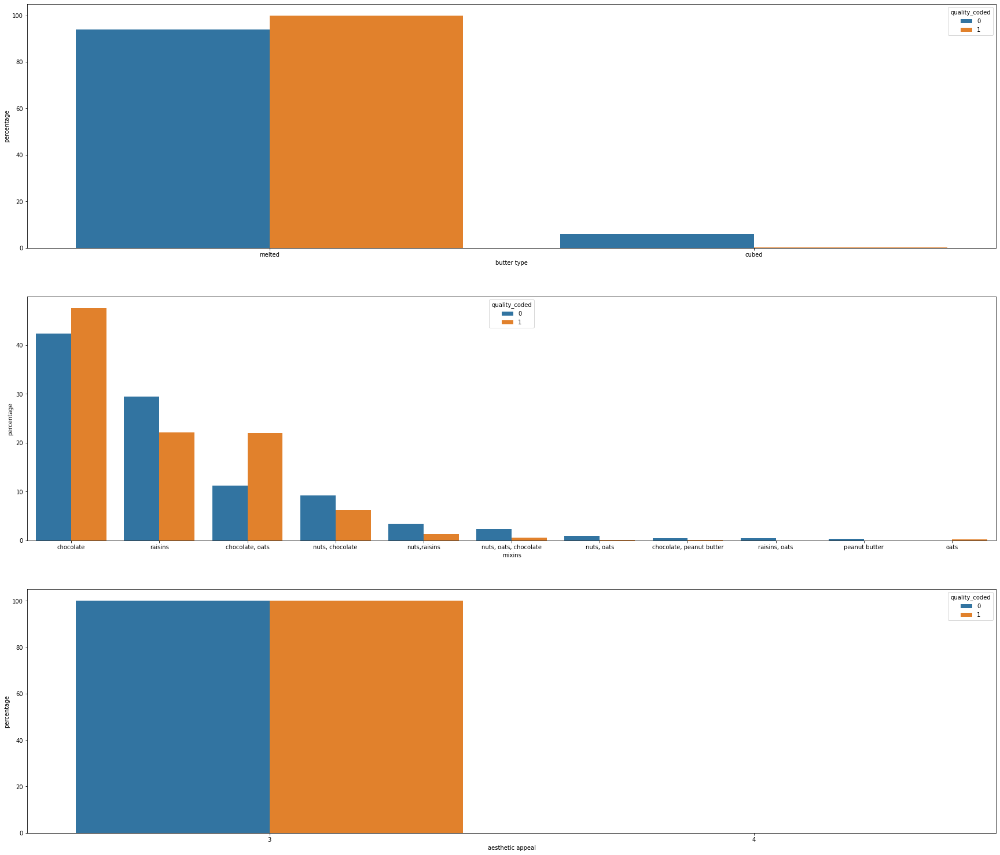

In [ ]:
# % cat features vs target encoded

_=plt.figure(figsize=(30,45))
n=1
for col in df1[cat_features].columns:
    if col == 'quality_coded' or col == 'quality':
        continue
    if df1[col].nunique() < 100:
        values=(df1.groupby(['quality_coded'])[col]
                     .value_counts(normalize=True, dropna=False)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
        _ = plt.subplot(5,1,n)
        _ = sns.barplot(x=col, y="percentage", hue="quality_coded", data=values)
        n= n+1

> Good cookies are using more Melted Butter

> Bad cookies are using more Cubed Butter

> Aesthetic Appeal has no impact on Quality

> Chocolate, Raisins, Oats as Mixins appear most in the ingredients of making cookies


###### Num vs Target encoded

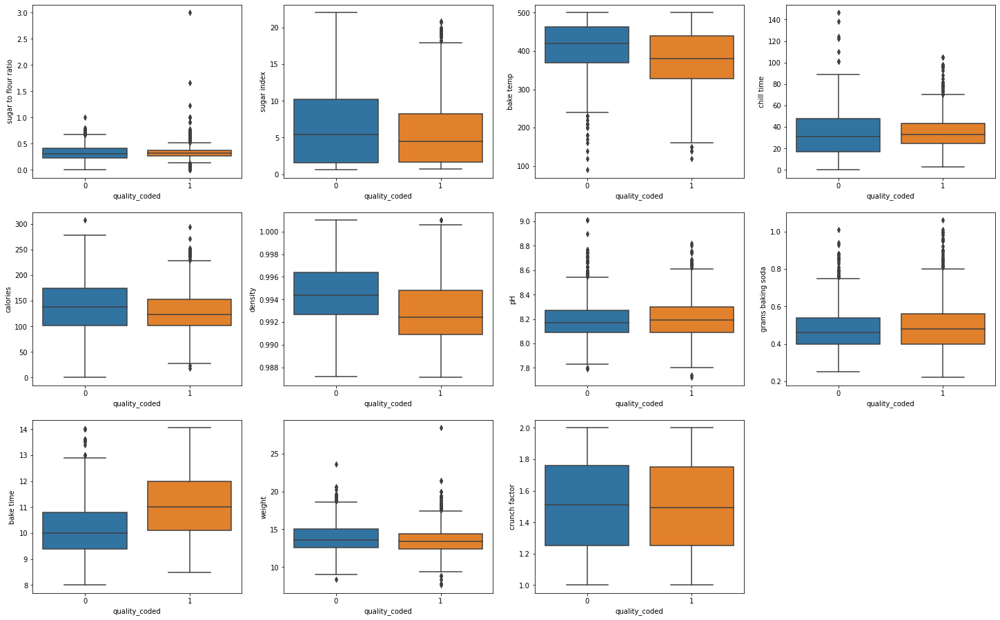

In [ ]:
# Boxplot of numerical values  vs Target - quality 
column_list = df1[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
  var = 'quality_coded'
  data = pd.concat([column_list[col], df1[var]], axis=1)
  _ = plt.subplot(11,4,n)
  _ = sns.boxplot(x=var, y =column_list[col], data=data )
  #_ = plt.title(col)
  n = n+1

> Crunch Factor has no impact on target encoded


In [ ]:
df1['mixins'].value_counts()

chocolate                   1395
raisins                      736
chocolate, oats              569
nuts, chocolate              215
nuts,raisins                  58
nuts, oats, chocolate         33
nuts, oats                    10
chocolate, peanut butter       5
raisins, oats                  4
oats                           4
peanut butter                  3
Name: mixins, dtype: int64

<Figure size 3600x3240 with 0 Axes>

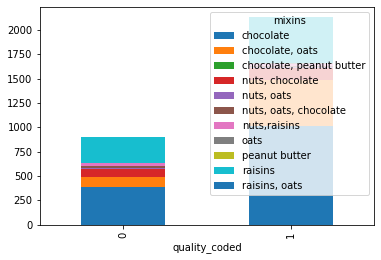

In [ ]:
_=plt.figure(figsize=(50, 45))
ct3 = pd.crosstab(df1['quality_coded'], df['mixins'])

ct3.plot.bar(stacked=True)
plt.legend(title='mixins')

plt.show()

In [ ]:
df1[num_features].columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight',
       'crunch factor'],
      dtype='object')

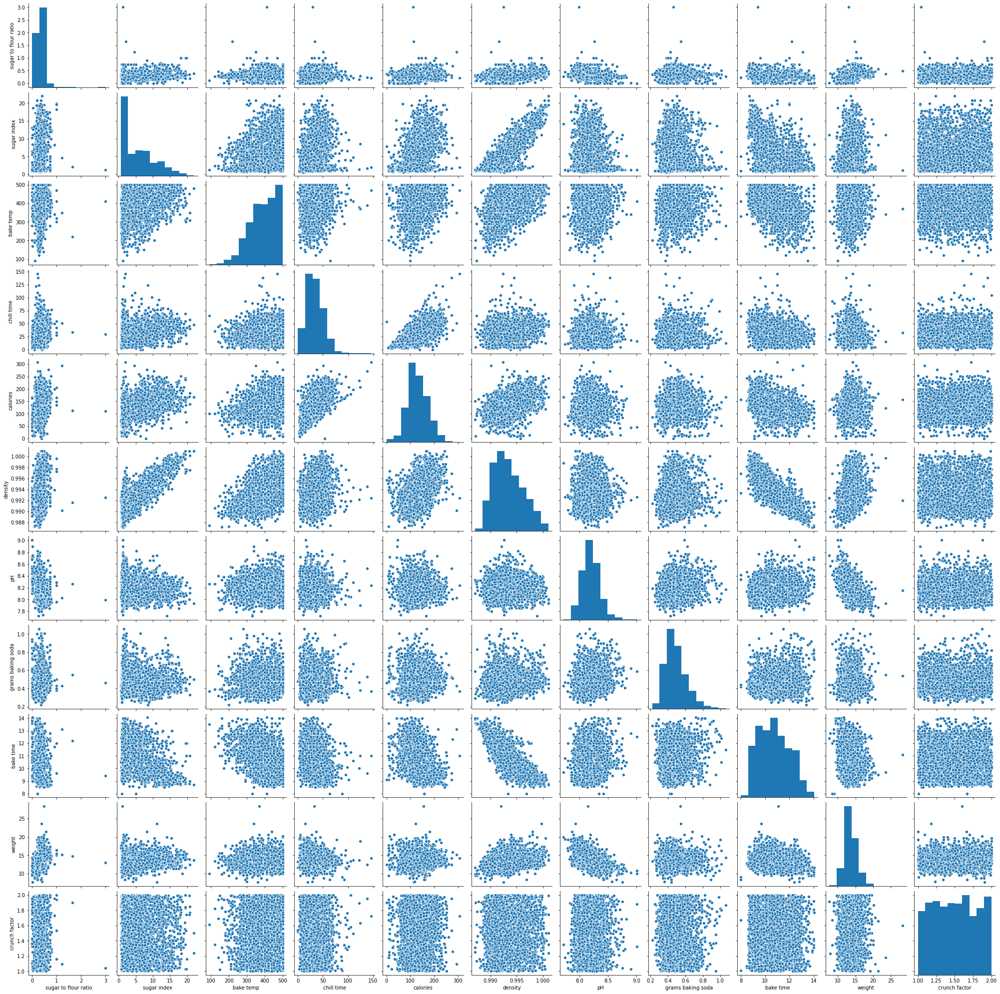

In [ ]:
# pairplot to see all num variables
sns.pairplot(df1[num_features])

### df2 - bake temp >500 don't drop

In [ ]:
# After checking the highest baking temperature, 500F is the max. 
# 30% of the total values 
df2 = df.copy()

In [ ]:
# select bake temp > 500

df2[df2['bake temp']>500]

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,mixins,crunch factor,aesthetic appeal
1,0.23,3.3,520,34.0,113.000000,0.99429,8.16,0.48,8.4,7,melted,12.4,raisins,1.71,3
4,0.24,2.4,770,6.0,33.000000,0.99740,8.09,0.57,9.4,5,cubed,19.8,"nuts, oats, chocolate",1.30,3
8,0.18,1.8,700,13.0,40.000000,0.99700,8.44,0.60,9.1,5,cubed,14.2,"nuts, oats, chocolate",1.89,3
19,0.05,2.1,610,20.0,49.000000,0.99705,8.31,0.55,9.7,3,cubed,14.6,"raisins, oats",1.48,3
22,0.28,14.7,510,29.0,115.022679,0.99792,7.96,0.39,9.0,9,melted,14.0,"chocolate, oats",1.08,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5187,0.08,2.1,1050,16.0,44.000000,0.99580,8.13,0.52,11.0,5,cubed,16.8,"nuts,raisins",1.17,3
5189,0.32,2.1,640,4.0,15.000000,0.99576,8.30,0.80,11.2,6,cubed,18.2,raisins,1.20,3
5191,0.10,2.8,810,13.0,28.000000,0.99631,8.60,0.66,10.2,5,cubed,12.2,"nuts, oats",1.27,3
5196,0.33,1.4,560,35.0,136.000000,0.99380,8.63,0.78,10.3,8,melted,13.8,chocolate,1.77,3


In [ ]:
# bad value reprensents more than 40% of the whole dataset

(df2[df2['bake temp']>500]['bake temp'].count())/ len(df2['bake temp'])*100

41.47847905809689

In [ ]:
df2[df2['bake temp']<200]

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,mixins,crunch factor,aesthetic appeal
144,0.41,1.40,160,6.0,55.0,0.98876,8.16,0.40,13.4,7,melted,13.8,chocolate,1.84,3
205,0.28,2.40,120,36.0,100.0,0.99064,8.26,0.39,11.7,9,melted,13.4,chocolate,1.82,3
206,0.30,3.10,180,15.0,37.0,0.99004,8.02,0.52,11.9,9,melted,14.2,"chocolate, oats",1.47,3
249,0.30,0.90,190,4.0,28.0,0.98931,8.20,0.36,12.0,8,melted,14.2,chocolate,1.32,3
303,0.32,7.40,150,47.0,124.0,0.99278,7.99,0.39,11.0,8,melted,15.6,"chocolate, oats",1.99,3
353,0.28,6.10,180,41.0,103.0,0.99122,8.24,0.32,12.2,8,melted,13.0,raisins,1.41,3
360,0.32,5.00,160,31.0,101.0,0.99186,7.99,0.39,11.0,8,melted,15.6,chocolate,1.83,3
600,0.38,5.10,190,22.0,82.0,0.98961,8.05,0.36,12.5,8,melted,12.4,"chocolate, oats",1.40,3
884,0.27,1.70,140,45.0,104.0,0.98914,8.40,0.56,12.6,9,melted,11.6,raisins,1.18,3
1293,0.24,2.70,170,22.0,80.0,0.99084,8.03,0.37,11.5,7,melted,13.4,raisins,1.25,3


In [ ]:
# bad value reprensents more than 60% of the whole dataset

(df2[df2['bake temp']<200]['bake temp'].count())/ len(df2['bake temp'])*100

0.5983400887859486

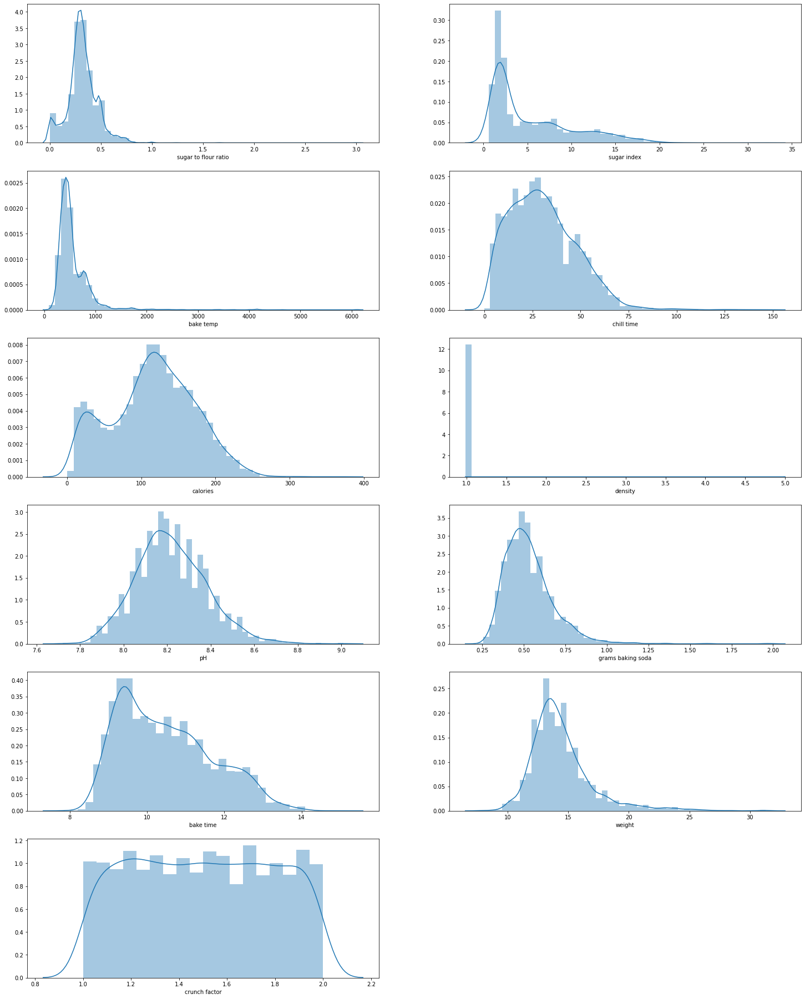

In [ ]:
# Distribution of numerical values 
column_list = df2[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
    _ = plt.subplot(11,2,n)
    _ = sns.distplot(column_list[col])
    #_ = plt.title(col)
    n = n+1

In [ ]:
df2.columns.value_counts().sum()

15

In [ ]:
#df1.groupby(['quality','butter type']).count()

##### Target orignial

###### Study Target 

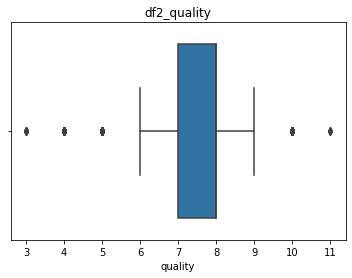

In [ ]:
# target: Boxplot
_ = plt.title('df2_quality')
_ = sns.boxplot(x=df2["quality"])


In [ ]:
df2_target_study = (df2['quality'].value_counts() / len(df2['quality']) *100).to_frame()
df2_target_study.columns = ['percentage']
df2_target_study.index.names = ['Quality']
df2_target_study['Quality'] = df2_target_study.index

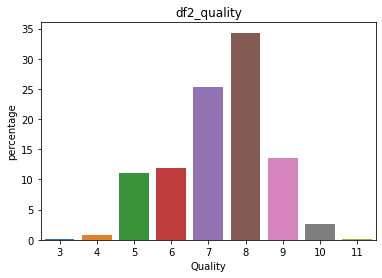

In [ ]:
sns.barplot(x = 'Quality', y = 'percentage', data=df2_target_study)
#plt.xticks(rotation = 90)
_ = plt.title('df2_quality')
plt.show()

###### Cat vs Target 

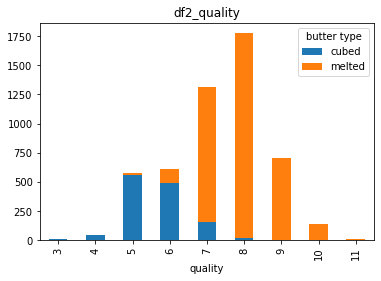

In [ ]:
# cat feature - Butter Type vs target - Quality (value)
# https://stackoverflow.com/questions/43544694/using-pandas-crosstab-with-seaborn-stacked-barplots

df2_ct1 = pd.crosstab(df2.quality, df2['butter type'])

df2_ct1.plot.bar(stacked=True)
plt.legend(title='butter type')
_ = plt.title('df2_quality')
plt.show()

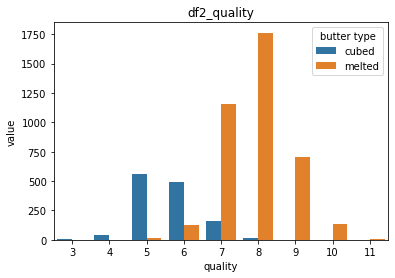

In [ ]:
 # now stack and reset
 stacked = df2_ct1.stack().reset_index().rename(columns={0:'value'})

 # plot grouped bar chart
 _ = plt.title('df2_quality')

 sns.barplot(x=stacked.quality, y=stacked.value, hue=stacked['butter type'])

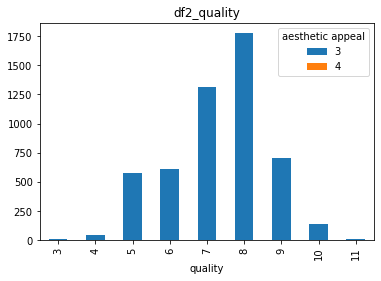

In [ ]:
# cat feature - aesthetic appeal vs target - Quality (value)
df2_ct2 = pd.crosstab(df2.quality, df2['aesthetic appeal'])

df2_ct2.plot.bar(stacked=True)
plt.legend(title='aesthetic appeal')
_ = plt.title('df2_quality')

plt.show()

In [ ]:
cat_features

['quality', 'butter type', 'mixins', 'aesthetic appeal']

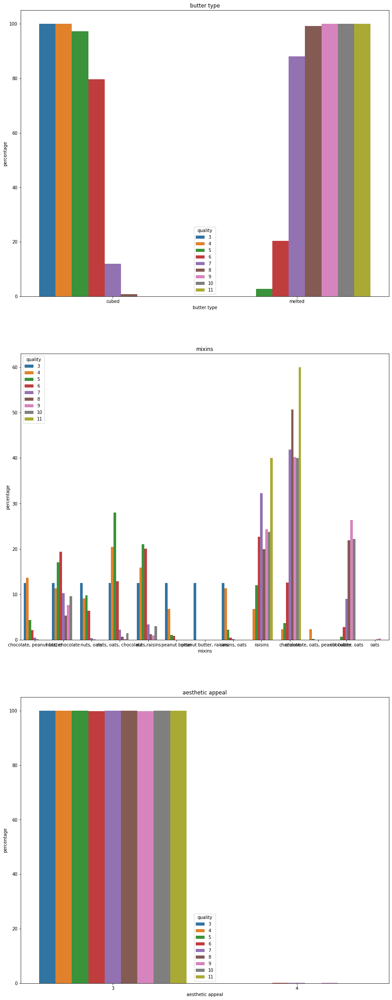

In [ ]:
# % cat features vs target

_=plt.figure(figsize=(15,55))
n=1
for col in df2[cat_features].columns:
    if col == 'quality':
        continue
    if df2[col].nunique() < 100:
        values=(df.groupby(['quality'])[col]
                     .value_counts(normalize=True, dropna=False)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
        _ = plt.subplot(4,1,n)
        _ = sns.barplot(x=col, y="percentage", hue="quality", data=values)
        _ = plt.title(col)
        n= n+1

Aesthetic appeal doesn't have impact on orignial target

###### Num vs Target

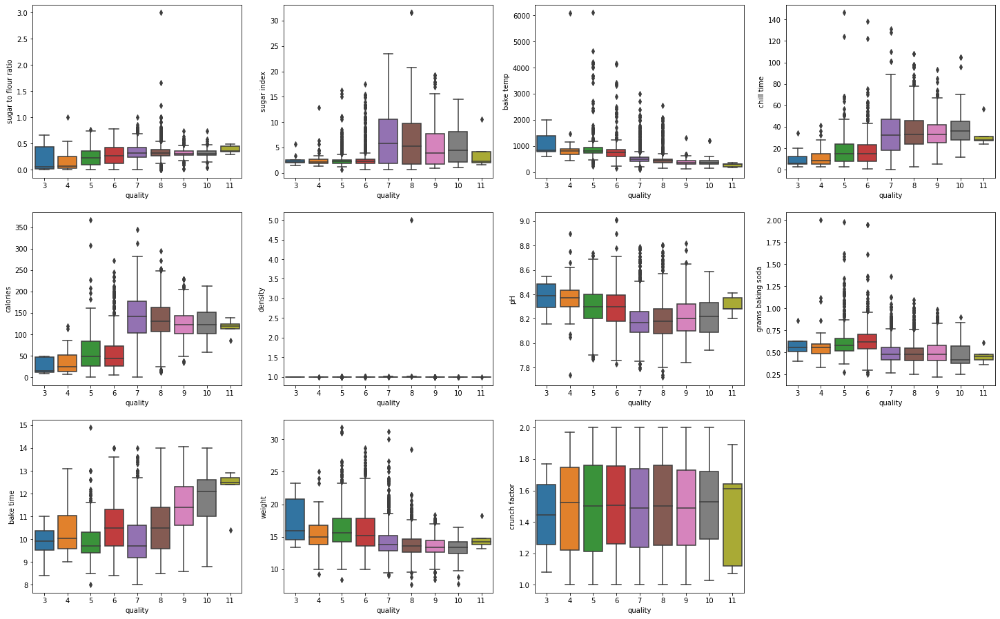

In [ ]:
# Boxplot of numerical values  vs Target - quality 
column_list = df2[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
  var = 'quality'
  data = pd.concat([column_list[col], df2[var]], axis=1)
  _ = plt.subplot(11,4,n)
  _ = sns.boxplot(x=var, y =column_list[col], data=data )
  #_ = plt.title(col)
  n = n+1

> Good cookies have higher Calories

> Good cookies with low Bake Temp

> Good cookies have longer Chill Time

> Density has no impact with target


##### Target encoded: 2

Bad cookies vs Good cookies

In [ ]:
# Creating classes of target without dropping high temp rows

def encode_units(x):
    if (3 <= x <= 7):
        return 0
    if (8 <= x <= 11):
        return 1
df2['quality_coded'] = df2['quality'].apply(encode_units)

In [ ]:
df2.columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time',
       'quality', 'butter type', 'weight', 'mixins', 'crunch factor',
       'aesthetic appeal', 'quality_coded'],
      dtype='object')

###### Study Target encoded

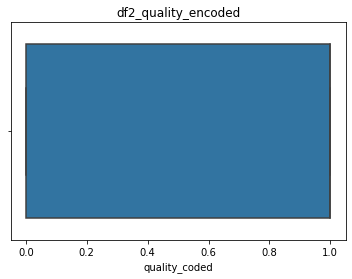

In [ ]:
# target: Boxplot
_ = plt.title('df2_quality_encoded')
_ = sns.boxplot(x=df2["quality_coded"])

In [ ]:
# % of each class in the target

df2_target_study_encoded = (df2['quality_coded'].value_counts() / len(df2['quality_coded']) *100).to_frame()
df2_target_study_encoded.columns = ['percentage']
df2_target_study_encoded.index.names = ['Quality Encoded']
df2_target_study_encoded['Quality Encoded'] = df2_target_study_encoded.index


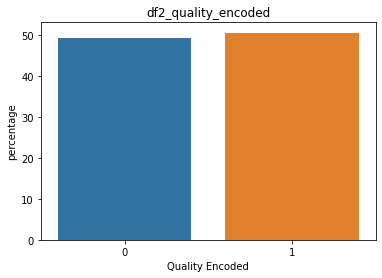

In [ ]:
# barplot % of each class in the target

sns.barplot(x ='Quality Encoded', y = 'percentage', data=df2_target_study_encoded)
#plt.xticks(rotation = 90)
_ = plt.title('df2_quality_encoded')
plt.show()

###### Cat vs Target encoded

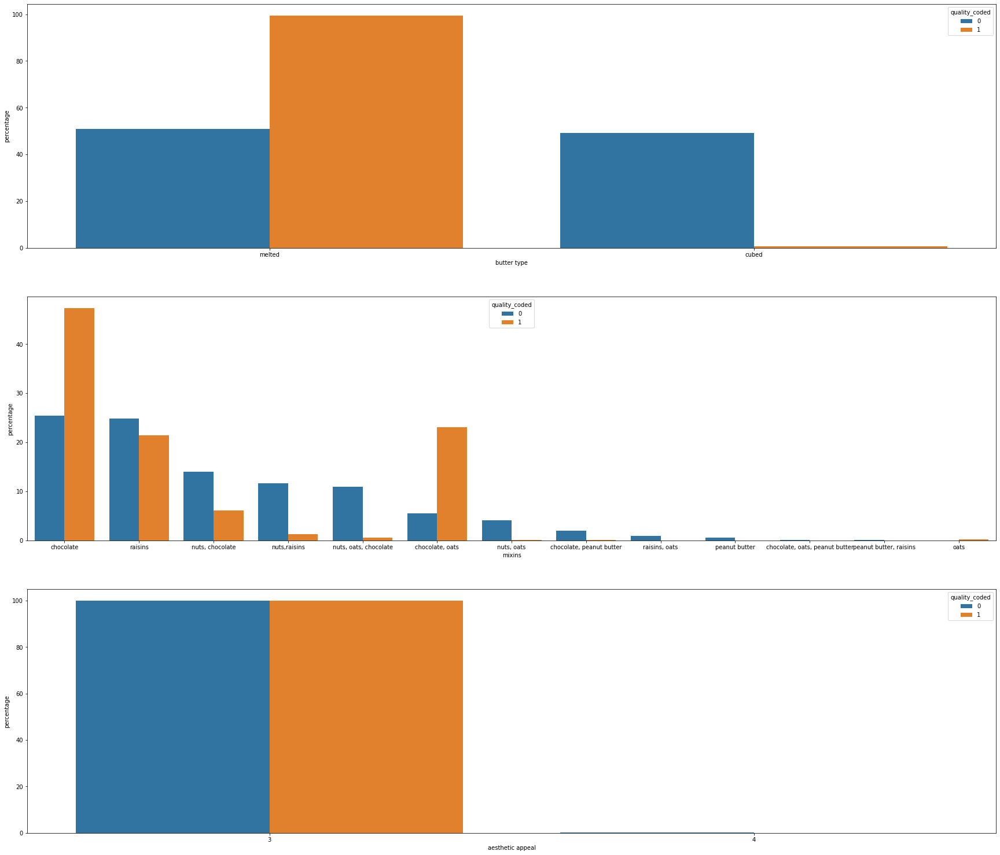

In [ ]:
# % cat features vs target encoded

_=plt.figure(figsize=(30,45))
n=1
for col in df2[cat_features].columns:
    if col == 'quality_coded' or col == 'quality':
        continue
    if df1[col].nunique() < 100:
        values=(df2.groupby(['quality_coded'])[col]
                     .value_counts(normalize=True, dropna=False)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
        _ = plt.subplot(5,1,n)
        _ = sns.barplot(x=col, y="percentage", hue="quality_coded", data=values)
        n= n+1

> Good cookies are using more Melted Butter

> Bad cookies are using more Cubed Butter

> Aesthetic Appeal has no impact on Quality

> Chocolate and Oats together make better cookies


###### Num vs Target encoded

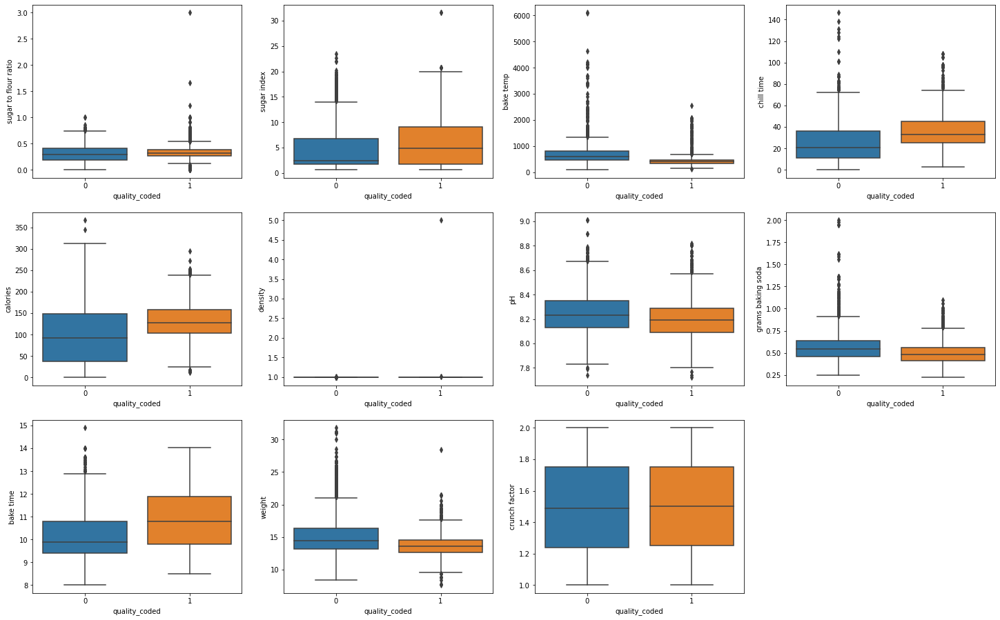

In [ ]:
# Boxplot of numerical values  vs Target - quality 
column_list = df2[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
  var = 'quality_coded'
  data = pd.concat([column_list[col], df2[var]], axis=1)
  _ = plt.subplot(11,4,n)
  _ = sns.boxplot(x=var, y =column_list[col], data=data )
  #_ = plt.title(col)
  n = n+1

> Crunch Factor has no impact on target encoded

> Density has no impact on target encoded


In [ ]:
df2['mixins'].value_counts()

chocolate                         1892
raisins                           1196
chocolate, oats                    745
nuts, chocolate                    519
nuts,raisins                       331
nuts, oats, chocolate              293
nuts, oats                         107
chocolate, peanut butter            52
raisins, oats                       24
peanut butter                       15
oats                                 4
chocolate, oats, peanut butter       2
peanut butter, raisins               1
Name: mixins, dtype: int64

<Figure size 3600x3240 with 0 Axes>

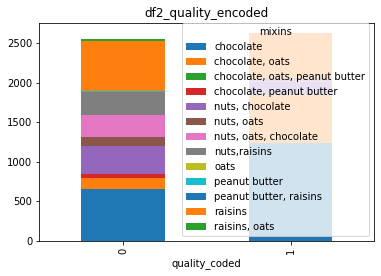

In [ ]:
_=plt.figure(figsize=(50, 45))
df2_ct3 = pd.crosstab(df2['quality_coded'], df2['mixins'])

df2_ct3.plot.bar(stacked=True)
plt.legend(title='mixins')
_=plt.title('df2_quality_encoded')
plt.show()

In [ ]:
df2[num_features].columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight',
       'crunch factor'],
      dtype='object')

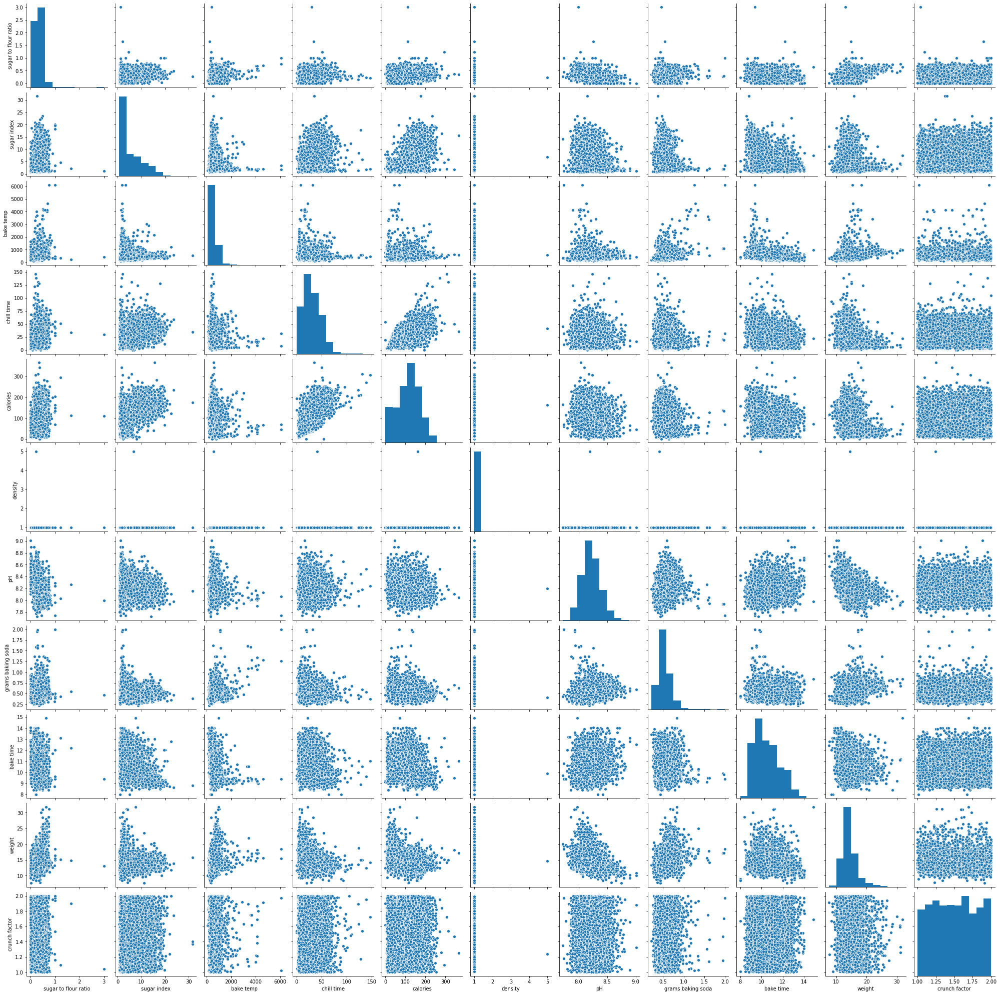

In [ ]:
sns.pairplot(df2[num_features])

### df3 - Encoding bake temp

In [ ]:
# After checking the highest baking temperature, 500F is the max. 
# 30% of the total values 
df3 = df.copy()

https://www.nist.gov/pml/weights-and-measures/si-units-temperature

Based on the reality article 

![alt text](https://drive.google.com/uc?id=1DtP_k1FsXEWsO2YVystgc4hMfceAtKB-)

In [ ]:
# Encoding Bake Temp to categrorical feature

def encode_units(x):
    if (x < 200 or x > 500):
        return "Extreme"
    if (200 <= x <= 325):
        return "Slow"
    if (325 < x <= 400):
        return "Moderate" 
    if (400 < x <= 500):
        return "Hot"   
df3['baketemp_coded'] = df3['bake temp'].apply(encode_units)
df3['baketemp_coded'].astype('category')

0           Slow
1        Extreme
2       Moderate
3            Hot
4        Extreme
          ...   
5193    Moderate
5194         Hot
5195         Hot
5196     Extreme
5197     Extreme
Name: baketemp_coded, Length: 5181, dtype: category
Categories (4, object): [Extreme, Hot, Moderate, Slow]

In [ ]:
# After encoding bake temp

df3.head()

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,mixins,crunch factor,aesthetic appeal,baketemp_coded
0,0.25,9.5,300,15.0,136.0,0.99367,8.10,0.44,12.1,8,melted,15.2,raisins,1.30,3,Slow
1,0.23,3.3,520,34.0,113.0,0.99429,8.16,0.48,8.4,7,melted,12.4,raisins,1.71,3,Extreme
2,0.18,1.9,360,33.0,106.0,0.98746,8.21,0.83,14.0,9,melted,9.4,"nuts, chocolate",1.78,3,Moderate
3,0.18,10.5,490,41.0,124.0,0.99630,8.14,0.35,10.5,7,melted,12.2,chocolate,1.59,3,Hot
4,0.24,2.4,770,6.0,33.0,0.99740,8.09,0.57,9.4,5,cubed,19.8,"nuts, oats, chocolate",1.30,3,Extreme


In [ ]:
df3.describe(include='all')

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,mixins,crunch factor,aesthetic appeal,baketemp_coded
count,5181.000000,5181.000000,5181.000000,5181.000000,5181.000000,5181.000000,5181.000000,5181.000000,5181.000000,5181.0,5181,5181.000000,5181,5181.000000,5181.0,5181
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.0,2,NaN,13,NaN,2.0,4
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,melted,NaN,chocolate,NaN,3.0,Extreme
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1778.0,3908,NaN,1892,NaN,5178.0,2180
mean,0.318215,5.401718,559.496236,30.383903,115.229225,0.995435,8.218653,0.531002,10.495561,NaN,NaN,14.405807,NaN,1.499025,NaN,NaN
std,0.149769,4.669065,353.265184,17.249170,56.075615,0.055723,0.161505,0.151002,1.194958,NaN,NaN,2.584684,NaN,0.289244,NaN,NaN
min,0.000000,0.600000,90.000000,0.000000,0.000000,0.987110,7.720000,0.220000,8.000000,NaN,NaN,7.600000,NaN,1.000000,NaN,NaN
25%,0.240000,1.800000,380.000000,17.000000,77.000000,0.992300,8.110000,0.430000,9.500000,NaN,NaN,12.800000,NaN,1.250000,NaN,NaN
50%,0.310000,3.000000,470.000000,29.000000,118.000000,0.994800,8.210000,0.510000,10.300000,NaN,NaN,14.000000,NaN,1.500000,NaN,NaN
75%,0.390000,8.000000,640.000000,41.000000,155.000000,0.996910,8.320000,0.600000,11.300000,NaN,NaN,15.400000,NaN,1.750000,NaN,NaN


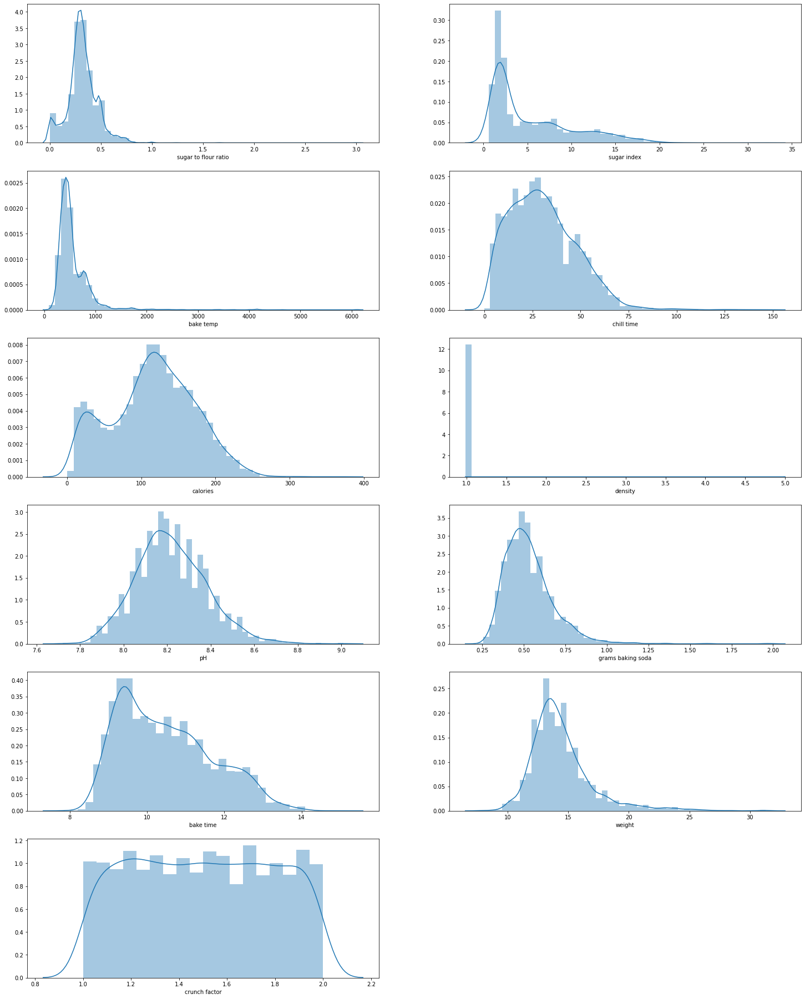

In [ ]:
# Distribution of numerical values 
column_list = df3[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
    _ = plt.subplot(11,2,n)
    _ = sns.distplot(column_list[col])
    #_ = plt.title(col)
    n = n+1

In [ ]:
df3.columns.value_counts().sum()

16

In [ ]:

cat_features = []
num_features = []

for i in df3:
    if df3[i].dtype == 'object' or df3[i].dtype.name == 'category':
        cat_features.append(i)
        
    elif df3[i].dtype == 'int64' or df3[i].dtype == 'float64':
        num_features.append(i)
       
        
print( "cat_features = ", cat_features)
print("num_features = ", num_features)

cat_features =  ['quality', 'butter type', 'mixins', 'aesthetic appeal', 'baketemp_coded']
num_features =  ['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time', 'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight', 'crunch factor']


##### Target orignial

###### Study Target 

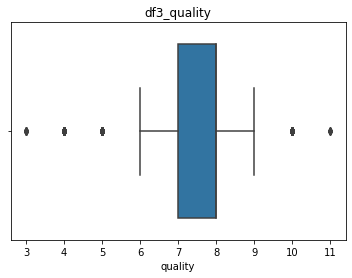

In [ ]:
# target: Boxplot
_ = plt.title('df3_quality')
_ = sns.boxplot(x=df3["quality"])


In [ ]:
df3_target_study = (df3['quality'].value_counts() / len(df3['quality']) *100).to_frame()
df3_target_study.columns = ['percentage']
df3_target_study.index.names = ['Quality']
df3_target_study['Quality'] = df3_target_study.index

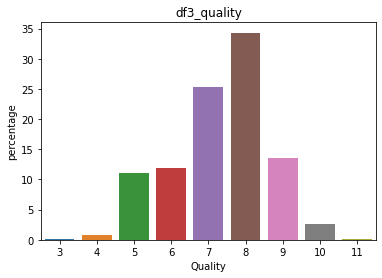

In [ ]:
sns.barplot(x = 'Quality', y = 'percentage', data=df3_target_study)
#plt.xticks(rotation = 90)
_ = plt.title('df3_quality')
plt.show()

###### Cat vs Target 

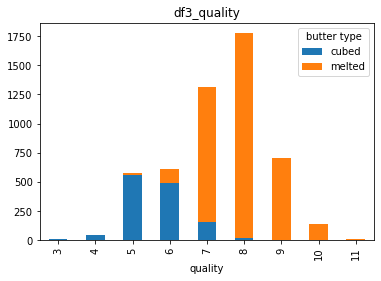

In [ ]:
# cat feature - Butter Type vs target - Quality (value)
# https://stackoverflow.com/questions/43544694/using-pandas-crosstab-with-seaborn-stacked-barplots

df3_ct1 = pd.crosstab(df3.quality, df3['butter type'])

df3_ct1.plot.bar(stacked=True)
plt.legend(title='butter type')
_ = plt.title('df3_quality')
plt.show()

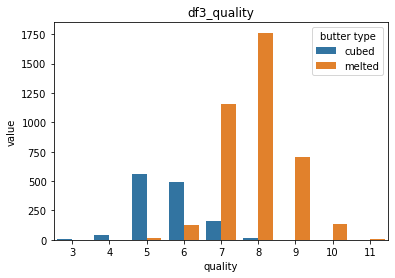

In [ ]:
 # now stack and reset
 stacked = df3_ct1.stack().reset_index().rename(columns={0:'value'})

 # plot grouped bar chart
 _ = plt.title('df3_quality')

 sns.barplot(x=stacked.quality, y=stacked.value, hue=stacked['butter type'])

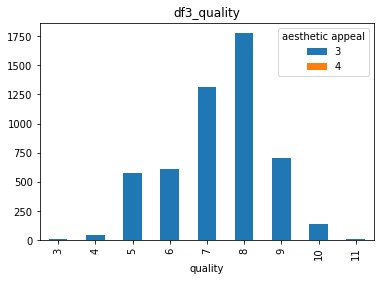

In [ ]:
# cat feature - aesthetic appeal vs target - Quality (value)
df3_ct2 = pd.crosstab(df3.quality, df3['aesthetic appeal'])

df3_ct2.plot.bar(stacked=True)
plt.legend(title='aesthetic appeal')
_ = plt.title('df3_quality')

plt.show()

In [ ]:
df3[cat_features].columns

Index(['quality', 'butter type', 'mixins', 'aesthetic appeal',
       'baketemp_coded'],
      dtype='object')

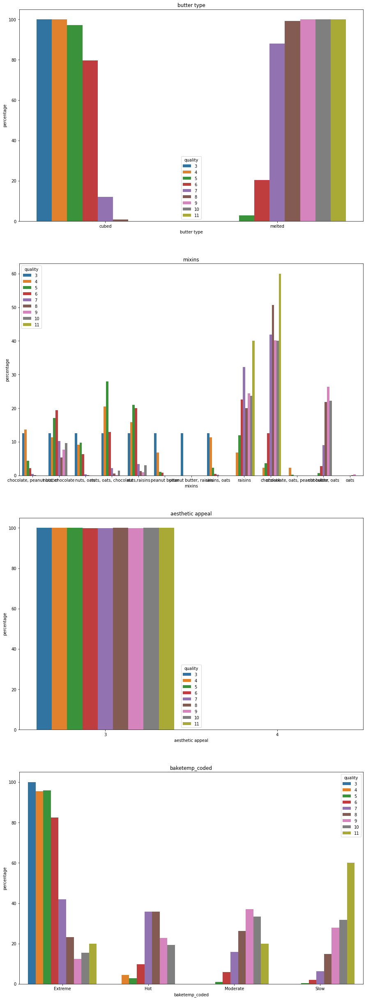

In [ ]:
# % cat features vs target

_=plt.figure(figsize=(15,55))
n=1
for col in df3[cat_features].columns:
    if col == 'quality':
        continue
    if df3[col].nunique() < 100:
        values=(df3.groupby(['quality'])[col]
                     .value_counts(normalize=True, dropna=False)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
        _ = plt.subplot(5,1,n)
        _ = sns.barplot(x=col, y="percentage", hue="quality", data=values)
        _ = plt.title(col)
        n= n+1

> Aesthetic appeal doesn't have impact on orignial target

> Good cookies are with slow bake temp, bad cookies are with extreme bake temp

###### Num vs Target

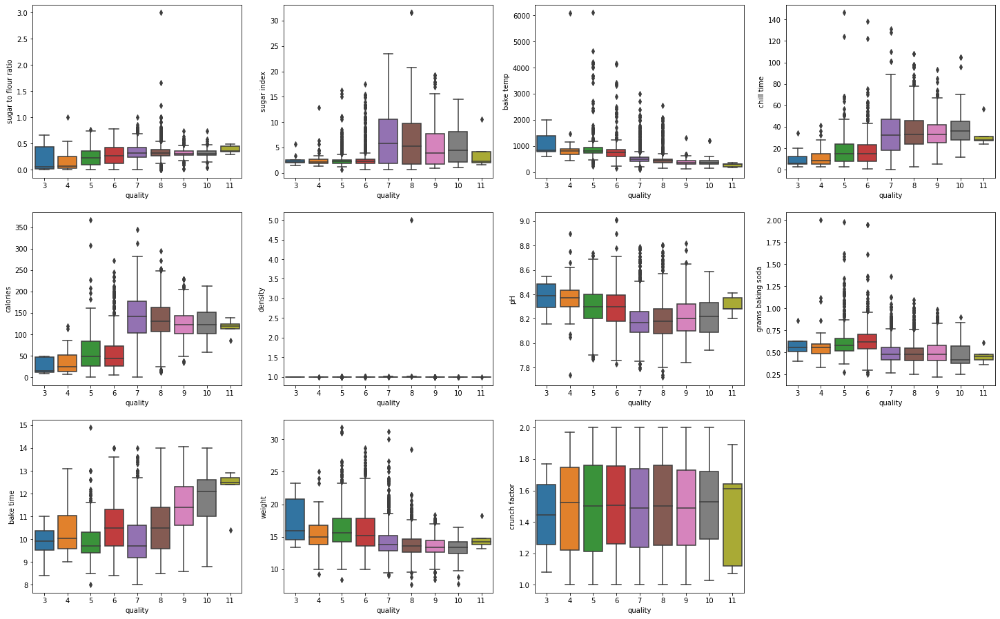

In [ ]:
# Boxplot of numerical values  vs Target - quality 
column_list = df3[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
  var = 'quality'
  data = pd.concat([column_list[col], df3[var]], axis=1)
  _ = plt.subplot(11,4,n)
  _ = sns.boxplot(x=var, y =column_list[col], data=data )
  #_ = plt.title(col)
  n = n+1

> Good cookies have higher Calories

> Good cookies with low Bake Temp

> Good cookies have longer Chill Time

> Density has no impact with target


##### Target encoded: 2

Bad cookies vs Good cookies

In [ ]:
# Creating classes of target with dytype high temp

def encode_units(x):
    if (3 <= x <= 7):
        return 0
    if (8 <= x <= 11):
        return 1
df3['quality_coded'] = df3['quality'].apply(encode_units)

In [ ]:
df3.columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time',
       'quality', 'butter type', 'weight', 'mixins', 'crunch factor',
       'aesthetic appeal', 'baketemp_coded', 'quality_coded'],
      dtype='object')

###### Study Target encoded

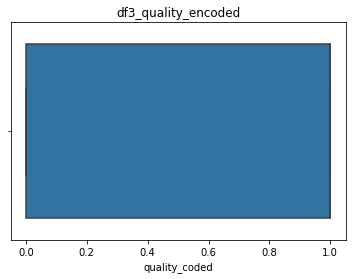

In [ ]:
# target: Boxplot
_ = plt.title('df3_quality_encoded')
_ = sns.boxplot(x=df3["quality_coded"])

In [ ]:
# % of each class in the target

df3_target_study_encoded = (df3['quality_coded'].value_counts() / len(df3['quality_coded']) *100).to_frame()
df3_target_study_encoded.columns = ['percentage']
df3_target_study_encoded.index.names = ['Quality Encoded']
df3_target_study_encoded['Quality Encoded'] = df3_target_study_encoded.index


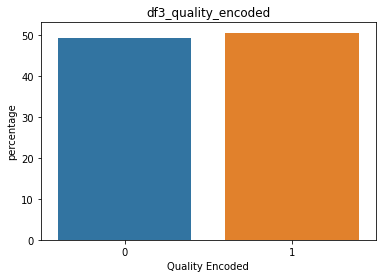

In [ ]:
# barplot % of each class in the target

sns.barplot(x ='Quality Encoded', y = 'percentage', data=df3_target_study_encoded)
#plt.xticks(rotation = 90)
_ = plt.title('df3_quality_encoded')
plt.show()

###### Cat vs Target encoded

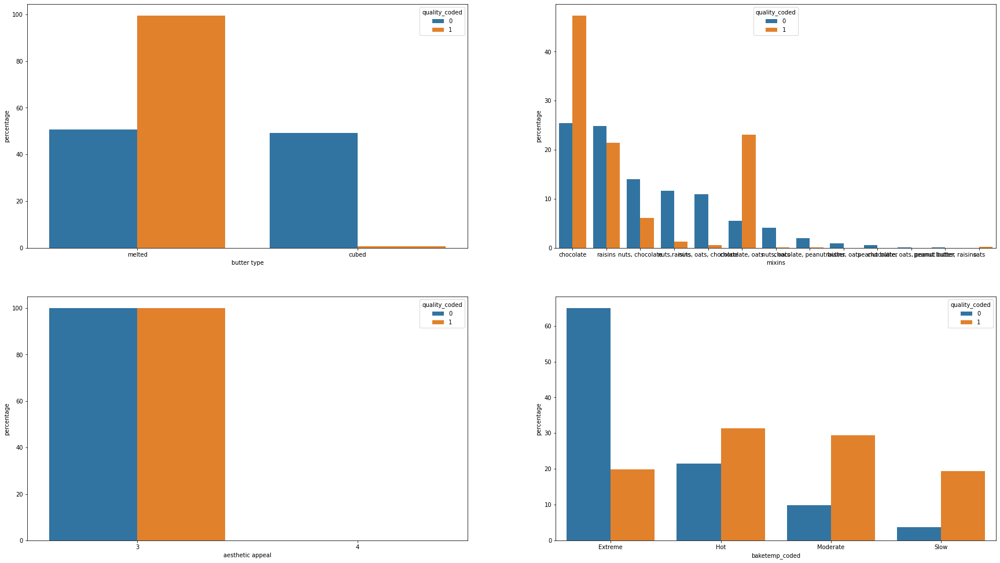

In [ ]:
# % cat features vs target encoded

_=plt.figure(figsize=(30,45))
n=1
for col in df3[cat_features].columns:
    if col == 'quality_coded' or col == 'quality':
        continue
    if df3[col].nunique() < 100:
        values=(df3.groupby(['quality_coded'])[col]
                     .value_counts(normalize=True, dropna=False)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
        _ = plt.subplot(5,2,n)
        _ = sns.barplot(x=col, y="percentage", hue="quality_coded", data=values)
        n= n+1

> Good cookies are using more Melted Butter

> Bad cookies are using more Cubed Butter

> Aesthetic Appeal has no impact on Quality

> Chocolate and Oats together make better cookies

> Extrem Temperature leads to bad cookies


###### Num vs Target encoded

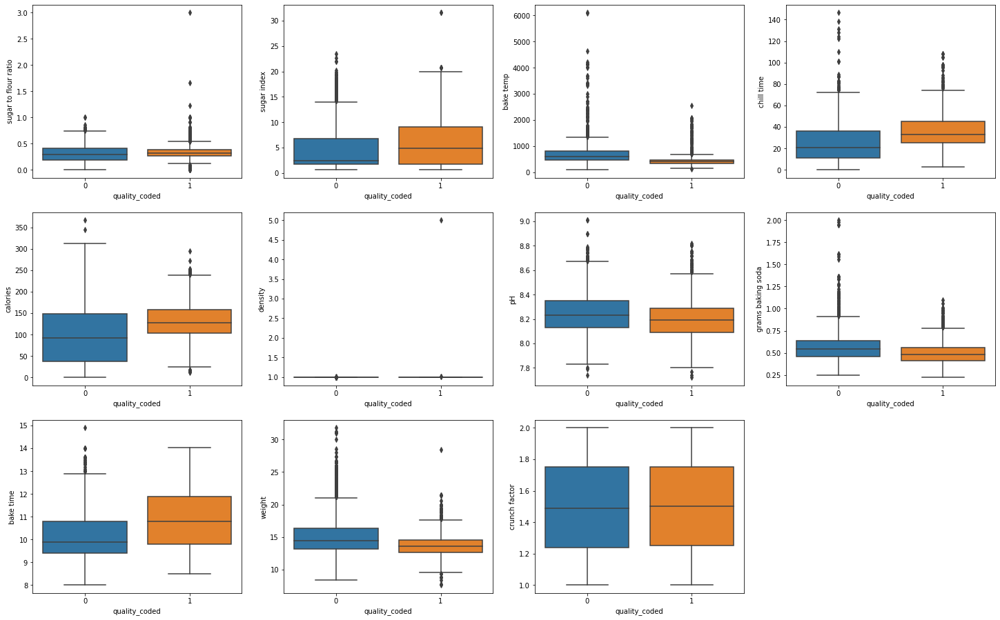

In [ ]:
# Boxplot of numerical values  vs Target - quality 
column_list = df3[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
  var = 'quality_coded'
  data = pd.concat([column_list[col], df3[var]], axis=1)
  _ = plt.subplot(11,4,n)
  _ = sns.boxplot(x=var, y =column_list[col], data=data )
  #_ = plt.title(col)
  n = n+1

> Crunch Factor has no impact on target encoded

> Density has no impact on target encoded


In [ ]:
df3['mixins'].value_counts()

chocolate                         1892
raisins                           1196
chocolate, oats                    745
nuts, chocolate                    519
nuts,raisins                       331
nuts, oats, chocolate              293
nuts, oats                         107
chocolate, peanut butter            52
raisins, oats                       24
peanut butter                       15
oats                                 4
chocolate, oats, peanut butter       2
peanut butter, raisins               1
Name: mixins, dtype: int64

<Figure size 3600x3240 with 0 Axes>

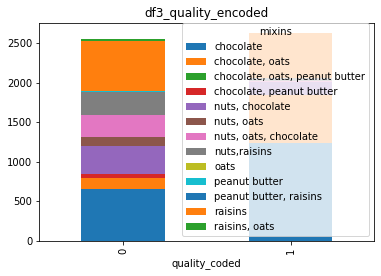

In [ ]:
_=plt.figure(figsize=(50, 45))
df3_ct3 = pd.crosstab(df2['quality_coded'], df2['mixins'])

df3_ct3.plot.bar(stacked=True)
plt.legend(title='mixins')
_=plt.title('df3_quality_encoded')
plt.show()

In [ ]:
df3[num_features].columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight',
       'crunch factor'],
      dtype='object')

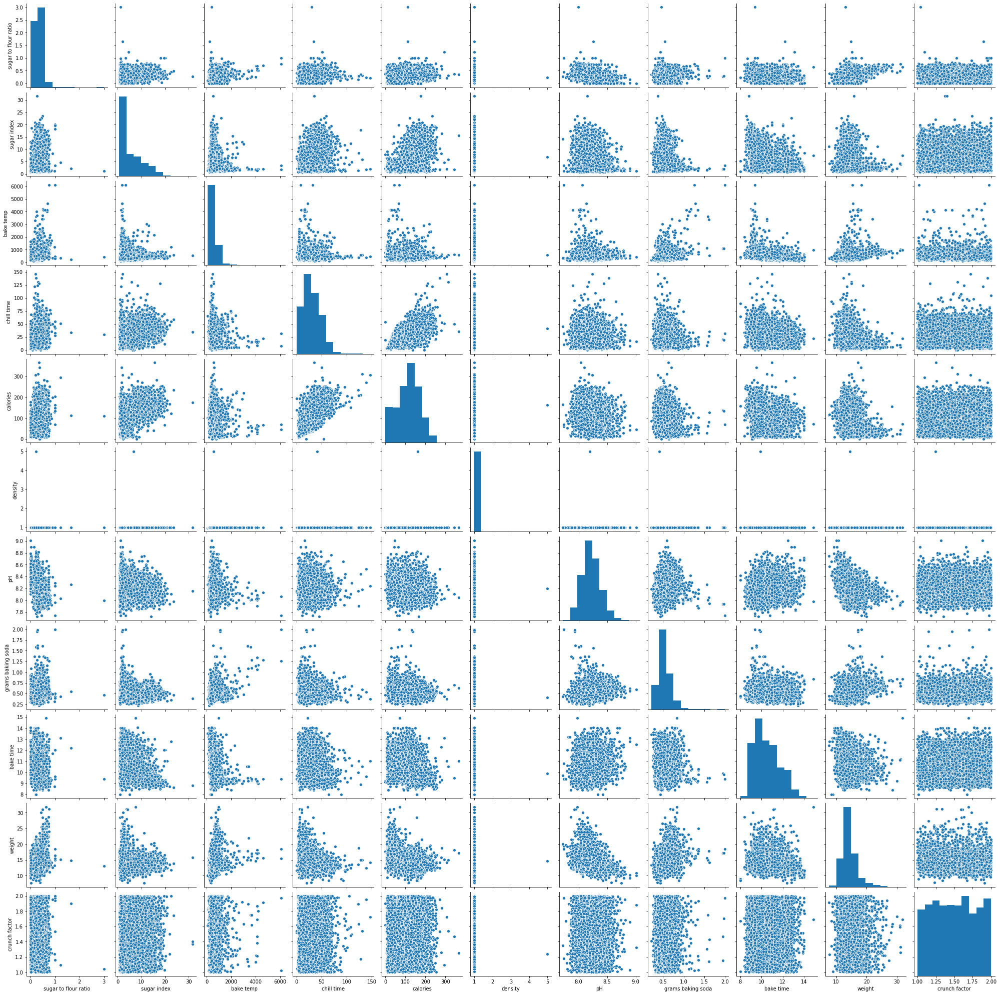

In [ ]:
sns.pairplot(df3[num_features])

##### Target encoded: 3

Divided target into 3 classes

In [ ]:
# Creating 3 classes for target: 

def encode_units(x):
    if (3 <= x <= 7):
        return 0
    if (  x == 8):
        return 1
    if (9 <= x <= 11):
        return 2
    
df3['quality3_coded'] = df3['quality'].apply(encode_units)

In [ ]:
df3.columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time',
       'quality', 'butter type', 'weight', 'mixins', 'crunch factor',
       'aesthetic appeal', 'baketemp_coded', 'quality_coded',
       'quality3_coded'],
      dtype='object')

###### Study Target encoded

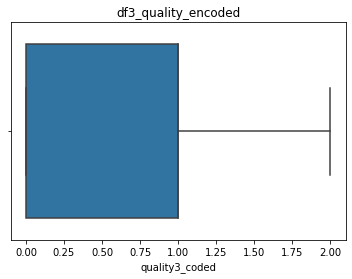

In [ ]:
# target: Boxplot
_ = plt.title('df3_quality_encoded')
_ = sns.boxplot(x=df3["quality3_coded"])

In [ ]:
# % of each class in the target

df3_target_3_encoded = (df3['quality3_coded'].value_counts() / len(df3['quality_coded']) *100).to_frame()
df3_target_3_encoded.columns = ['percentage']
df3_target_3_encoded.index.names = ['Quality Encoded']
df3_target_3_encoded['Quality Encoded'] = df3_target_3_encoded.index


In [ ]:
# barplot % of each class in the target

sns.barplot(x ='Quality Encoded', y = 'percentage', data=df3_target_3_encoded)
#plt.xticks(rotation = 90)
_ = plt.title('df3_quality3_encoded')
plt.show()

###### Cat vs Target encoded

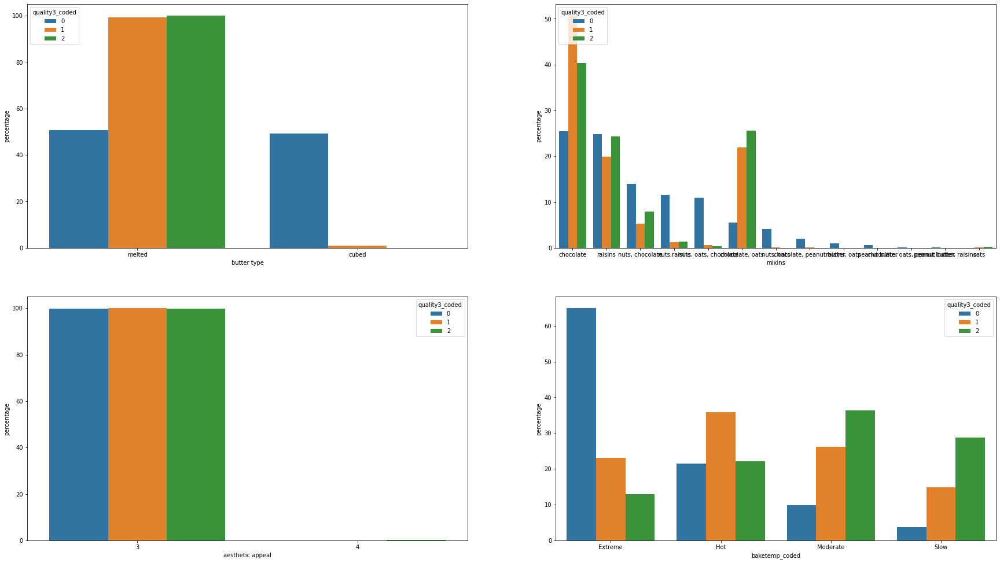

In [ ]:
# % cat features vs target encoded

_=plt.figure(figsize=(30,45))
n=1
for col in df3[cat_features].columns:
    if col == 'quality3_coded' or col == 'quality':
        continue
    if df3[col].nunique() < 100:
        values=(df3.groupby(['quality3_coded'])[col]
                     .value_counts(normalize=True, dropna=False)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
        _ = plt.subplot(5,2,n)
        _ = sns.barplot(x=col, y="percentage", hue="quality3_coded", data=values)
        n= n+1

###### Num vs Target encoded

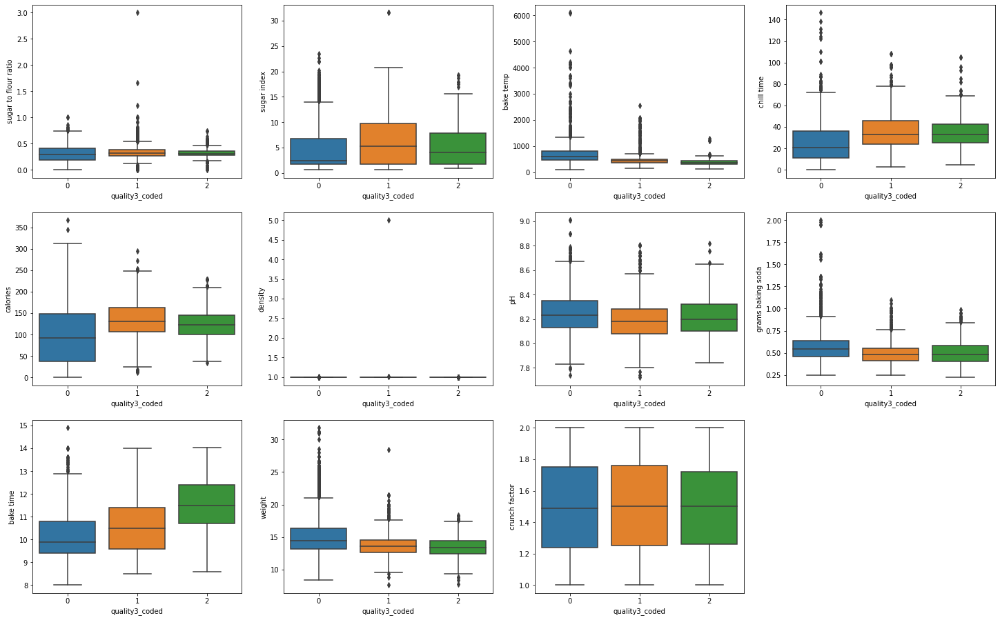

In [ ]:
# Boxplot of numerical values  vs Target - quality 
column_list = df3[num_features]
n=1 
_ = plt.figure(figsize=(25,60))
for col in column_list:
  var = 'quality3_coded'
  data = pd.concat([column_list[col], df3[var]], axis=1)
  _ = plt.subplot(11,4,n)
  _ = sns.boxplot(x=var, y =column_list[col], data=data )
  #_ = plt.title(col)
  n = n+1

> Crunch Factor has no impact on target encoded

> Density has no impact on target encoded


In [ ]:
df3['mixins'].value_counts()

chocolate                         1892
raisins                           1196
chocolate, oats                    745
nuts, chocolate                    519
nuts,raisins                       331
nuts, oats, chocolate              293
nuts, oats                         107
chocolate, peanut butter            52
raisins, oats                       24
peanut butter                       15
oats                                 4
chocolate, oats, peanut butter       2
peanut butter, raisins               1
Name: mixins, dtype: int64

<Figure size 3600x3240 with 0 Axes>

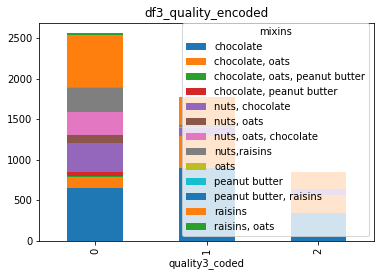

In [ ]:
_=plt.figure(figsize=(50, 45))
df3_ct3 = pd.crosstab(df3['quality3_coded'], df3['mixins'])

df3_ct3.plot.bar(stacked=True)
plt.legend(title='mixins')
_=plt.title('df3_quality_encoded')
plt.show()

In [ ]:
df3[num_features].columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight',
       'crunch factor'],
      dtype='object')

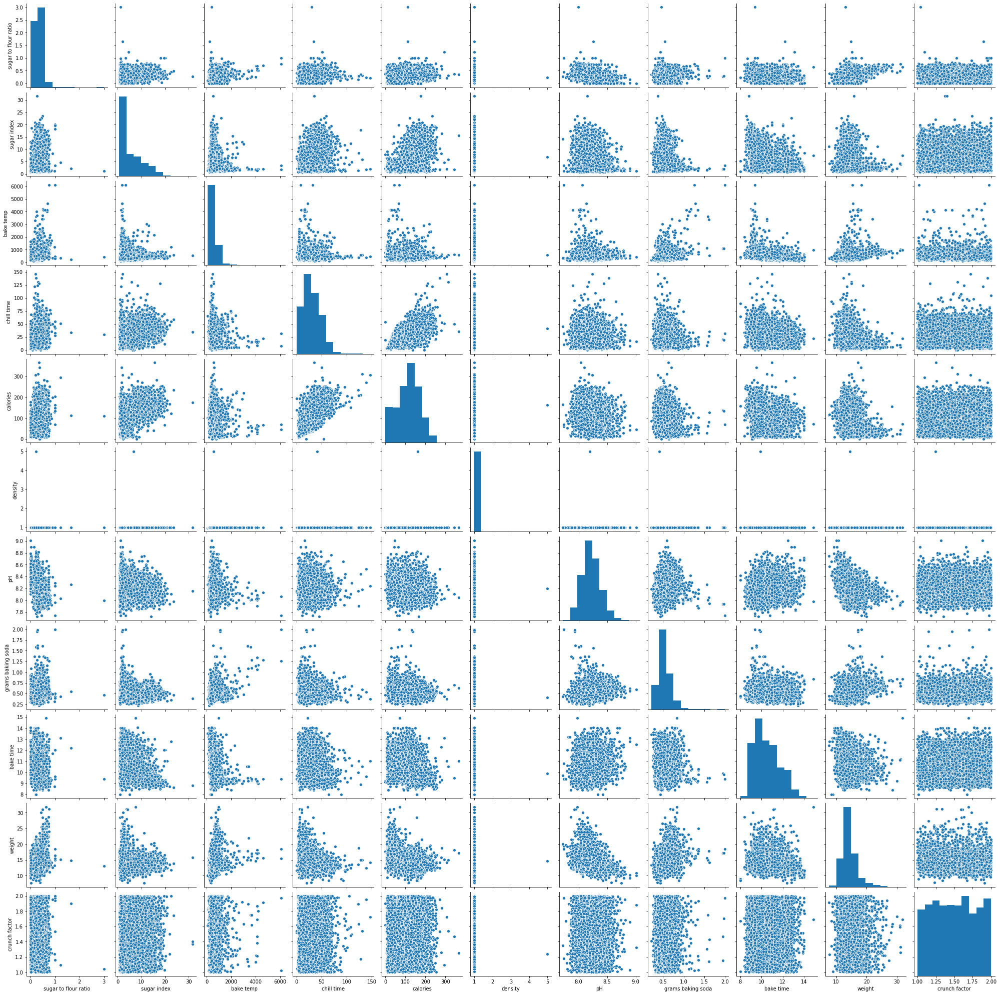

In [ ]:
sns.pairplot(df3[num_features])

# Feature Engineering - df3 

## Correlation Matrix - Num features

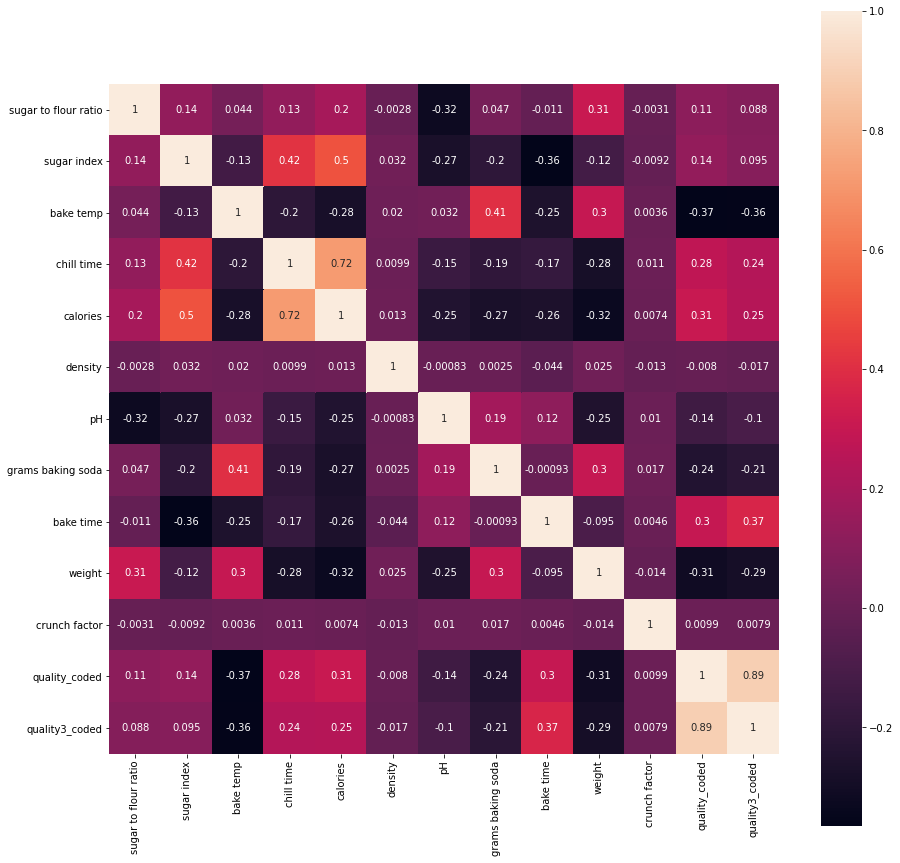

In [ ]:
corr = df3.corr()

fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(corr, square = True, annot = True,);


In [ ]:
cor = []
THRESHOLD=0.60
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if abs(corr.iloc[i,j]) >=THRESHOLD:
            cor.append(corr.columns[j])
            print('Column [' + corr.columns[i] + '] & Column [' + corr.columns[j]+'] are highly correlated  <'+str(corr.iloc[i,j])+'>' )

Column [chill time] & Column [calories] are highly correlated  <0.7181608644818006>
Column [quality_coded] & Column [quality3_coded] are highly correlated  <0.8933131199418194>


Based on boxplots and corr

> density has no impact on target encoded

> crunch factors has no impact on target encoded

> aesthetic appeal has no impact on target encoded

## Encoding - Cat features

In [ ]:
df3[cat_features].columns

Index(['quality', 'butter type', 'mixins', 'aesthetic appeal',
       'baketemp_coded'],
      dtype='object')

In [ ]:
df3[num_features].columns

Index(['sugar to flour ratio', 'sugar index', 'bake temp', 'chill time',
       'calories', 'density', 'pH', 'grams baking soda', 'bake time', 'weight',
       'crunch factor'],
      dtype='object')

In [ ]:
df3.head()

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,mixins,crunch factor,aesthetic appeal,baketemp_coded,quality_coded,quality3_coded
0,0.25,9.5,300,15.0,136.0,0.99367,8.10,0.44,12.1,8,melted,15.2,raisins,1.30,3,Slow,1,1
1,0.23,3.3,520,34.0,113.0,0.99429,8.16,0.48,8.4,7,melted,12.4,raisins,1.71,3,Extreme,0,0
2,0.18,1.9,360,33.0,106.0,0.98746,8.21,0.83,14.0,9,melted,9.4,"nuts, chocolate",1.78,3,Moderate,1,2
3,0.18,10.5,490,41.0,124.0,0.99630,8.14,0.35,10.5,7,melted,12.2,chocolate,1.59,3,Hot,0,0
4,0.24,2.4,770,6.0,33.0,0.99740,8.09,0.57,9.4,5,cubed,19.8,"nuts, oats, chocolate",1.30,3,Extreme,0,0


In [ ]:
# https://towardsdatascience.com/smarter-ways-to-encode-categorical-data-for-machine-learning-part-1-of-3-6dca2f71b159
!pip install category_encoders
import category_encoders as ce
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Category Encoder (Lable Encoding) for baketemp_coded
df_encoded = df3.copy()

# Encoding Bake Temp to categrorical feature

def encode_units1(x):
    if (x < 200 or x > 500):
        return "Extreme"
    if (200 <= x <= 325):
        return "Slow"
    if (325 < x <= 400):
        return "Moderate" 
    if (400 < x <= 500):
        return "Hot"   
df_encoded['baketemp_coded'] = df_encoded['bake temp'].apply(encode_units1)
df_encoded['baketemp_coded'].astype('category')


# Binary Encoder for butter type


def encode_units2(x):
    if (x == 'melted'):
        return 0
    if (x == 'cubed'):
        return 1
df_encoded['butter_coded'] = df_encoded['butter type'].apply(encode_units2)   
df_encoded['butter_coded'].astype('category')

# Ordinal Encoder for bake temp

def encode_units3(x):
    if (x == 'Extreme'):
        return 3
    if (x == 'Slow'):
        return 0
    if (x == 'Moderate'):
        return 1
    if (x == 'Hot'):
        return 2  
df_encoded['baketemp_coded'] = df_encoded['baketemp_coded'].apply(encode_units3)
df_encoded['baketemp_coded'].astype('category')


# get dummy for mixins

df_encoded2 = pd.get_dummies(df_encoded, columns = ['mixins'])
#df_encoded2 = df_encoded2.drop(['butter type'],axis=1)

df_encoded2.head()

,sugar to flour ratio,sugar index,bake temp,chill time,calories,density,pH,grams baking soda,bake time,quality,butter type,weight,crunch factor,aesthetic appeal,baketemp_coded,quality_coded,quality3_coded,butter_coded,mixins_chocolate,"mixins_chocolate, oats","mixins_chocolate, oats, peanut butter","mixins_chocolate, peanut butter","mixins_nuts, chocolate","mixins_nuts, oats","mixins_nuts, oats, chocolate","mixins_nuts,raisins",mixins_oats,mixins_peanut butter,"mixins_peanut butter, raisins",mixins_raisins,"mixins_raisins, oats"
0,0.25,9.5,300,15.0,136.0,0.99367,8.10,0.44,12.1,8,melted,15.2,1.30,3,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0.23,3.3,520,34.0,113.0,0.99429,8.16,0.48,8.4,7,melted,12.4,1.71,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0.18,1.9,360,33.0,106.0,0.98746,8.21,0.83,14.0,9,melted,9.4,1.78,3,1,1,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,0.18,10.5,490,41.0,124.0,0.99630,8.14,0.35,10.5,7,melted,12.2,1.59,3,2,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0.24,2.4,770,6.0,33.0,0.99740,8.09,0.57,9.4,5,cubed,19.8,1.30,3,3,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0


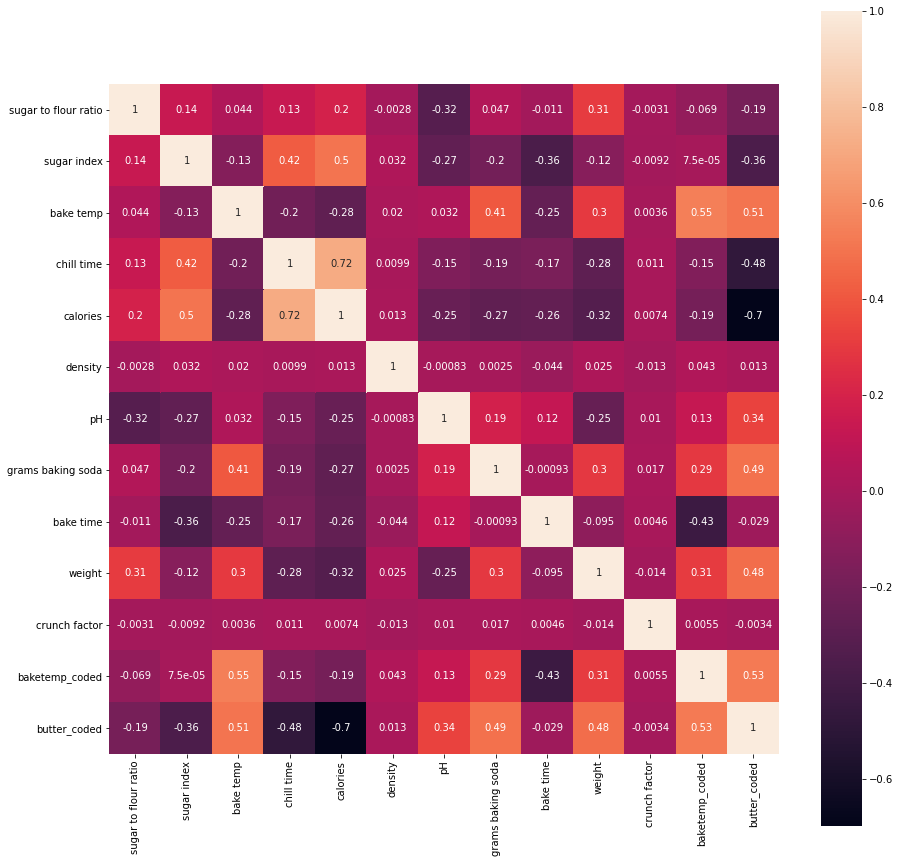

In [ ]:
corr = df_encoded.drop(['quality_coded','quality3_coded'],1).corr()

fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(corr, square = True, annot = True,);

In [ ]:
cor = []
THRESHOLD=0.60
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if abs(corr.iloc[i,j]) >=THRESHOLD:
            cor.append(corr.columns[j])
            print('Column [' + corr.columns[i] + '] & Column [' + corr.columns[j]+'] are highly correlated  <'+str(corr.iloc[i,j])+'>' )

Column [chill time] & Column [calories] are highly correlated  <0.7181608644818006>
Column [calories] & Column [butter_coded] are highly correlated  <-0.6989184133549363>


# Feature Selection - df_encoded

In [ ]:
# Based on previous study, these features have no impact with target feature - quality
selected = df_encoded2.drop(['density', 'aesthetic appeal', 'crunch factor'], axis=1)

# ML - Target: 3 classes

Models to use:
- Log reg
- KNN
- Random Forest
- (SVM)

## ML Libraries

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression, LogisticRegression

from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_validate
from sklearn import metrics
from sklearn.metrics import r2_score,accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

## Model scoring function

In [ ]:
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix, roc_curve, auc, classification_report

def print_scoresClassification(model, X_train, y_train, X_test, y_test, train=True):
    from sklearn.metrics import classification_report
    scoring = {'acc': 'accuracy',
           'prec_macro': 'precision_macro',
           'rec_macro': 'recall_macro',
           'f1_macro': 'f1_macro'}
    
    if train:
        scores = cross_validate(model, X_train, y_train, cv=10, scoring=scoring)
        ypredTrain = model.predict(X_train)
        Acc_train = scores['test_acc'].mean()
        Precision_train = scores['test_prec_macro'].mean()
        Recall_train = scores['test_rec_macro'].mean()
        F1_train = scores['test_f1_macro'].mean()
        conf_matrix_train = confusion_matrix(y_train, ypredTrain)
        class_report = classification_report(y_train, ypredTrain)
        
        print("Train Result :\n===========================================")
        print(f"CV - Accuracy : {Acc_train:.2f}\n")
        print(f"CV - Precision: {Precision_train:.2f}\n")
        print(f"CV- Recall: {Recall_train:.2f}\n")
        print(f"CV - F1 score: {F1_train:.2f}\n")    
        print(f"Confusion_matrix:\n {conf_matrix_train}\n") 
        print(f"Classif_report:\n {class_report}\n")
        sns.heatmap(conf_matrix_train/conf_matrix_train.sum(axis=0), annot=True, fmt='.2%', cmap='Blues')
        plt.show()
        

       
    elif train==False:
        scores = cross_validate(model, X_test, y_test, cv=10, scoring=scoring)
        ypredtest = model.predict(X_test)
        Acc_test = scores['test_acc'].mean()
        Precision_test = scores['test_prec_macro'].mean()
        Recall_test = scores['test_rec_macro'].mean()
        F1_test = scores['test_f1_macro'].mean()
        conf_matrix_test = confusion_matrix(y_test, ypredtest)
        class_report = classification_report(y_test, ypredtest)
        
        print("test Result:\n===========================================")
        print(f"CV - Accuracy : {Acc_test:.2f}\n")
        print(f"CV - Precision: {Precision_test:.2f}\n")
        print(f"CV - Recall: {Recall_test:.2f}\n")
        print(f"CV - F1 score: {F1_test:.2f}\n")    
        print(f"Confusion_matrix:\n {conf_matrix_test}\n")
        print(f"Classif_report:\n {class_report}\n")
        sns.heatmap(conf_matrix_test/conf_matrix_test.sum(axis=0), annot=True, fmt='.2%', cmap='Blues')
        plt.show()
        
        
        #y_pred=model.predict(X_test)
        # roc_curve
        #Y_pred_prob = model.predict_proba(X_test)[:, 1]
        #fpr, tpr, _ = roc_curve(y_test, Y_pred_prob)
        #AUC_score = roc_auc_score(y_test, y_pred)
        #print("AUC score: {:.2f}".format(AUC_score))
        #plt.figure(figsize=(12,5))
        #plt.plot([0, 1], [0, 1], 'k--', label='reference line')
        #plt.plot(fpr, tpr, label=model)
        #plt.xlabel('False positive rate')
        #plt.ylabel('True positive rate')
        #plt.title(model)
        #plt.legend(loc='best')
        #plt.show()

## Split data

In [ ]:
selected.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5181 entries, 0 to 5197
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   sugar to flour ratio                   5181 non-null   float64 
 1   sugar index                            5181 non-null   float64 
 2   bake temp                              5181 non-null   int64   
 3   chill time                             5181 non-null   float64 
 4   calories                               5181 non-null   float64 
 5   pH                                     5181 non-null   float64 
 6   grams baking soda                      5181 non-null   float64 
 7   bake time                              5181 non-null   float64 
 8   quality                                5181 non-null   category
 9   butter type                            5181 non-null   object  
 10  weight                                 5181 non-null   float

In [ ]:
from sklearn.model_selection import train_test_split
selected= selected.sample(frac=1)
X = selected.drop(['quality3_coded','quality','quality_coded','butter type','bake temp'], axis=1)
y = selected.quality3_coded

#### Balance data

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_sm, y_sm = smote.fit_sample(X, y)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
X_sm.shape

(7671, 23)

In [ ]:
y_sm.shape

(7671,)

In [ ]:
from scipy.stats import itemfreq


In [ ]:
print('\nBefore OVER-sampling\n', y.value_counts())
print('\nAfter OVER-resampling\n', itemfreq(y_sm))


Before OVER-sampling
 0    2557
1    1778
2     846
Name: quality3_coded, dtype: int64

After OVER-resampling
 [[   0 2557]
 [   1 2557]
 [   2 2557]]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `itemfreq` is deprecated!
`itemfreq` is deprecated and will be removed in a future version. Use instead `np.unique(..., return_counts=True)`
  


In [ ]:
# split test and train
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.35, random_state=0, stratify=y_sm)


### Transform data

In [ ]:
from sklearn.preprocessing import StandardScaler

X_train_sca = StandardScaler().fit_transform(X_train)
X_test_sca = StandardScaler().fit_transform(X_test)

## LOGISTIC REGRESSION

### Choose params

In [ ]:
#define parameter grid
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000] }
#create grid search estimator
grid_search_LogReg = GridSearchCV(LogisticRegression(), param_grid, cv=5, return_train_score=True)

In [ ]:
grid_search_LogReg.fit(X_train_sca, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (grid_search_LogReg.best_score_,
    grid_search_LogReg.best_params_))
#print test score
print('Test score: {:.2f}'.format(grid_search_LogReg.score(X_test_sca, y_test)))

Best score: 0.65 using {'C': 1000}
Test score: 0.64


In [ ]:
logreg_model1 = grid_search_LogReg.best_estimator_
logreg_model1.fit(X_train_sca, y_train)

LogisticRegression(C=1000, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Best Params - Slightly Overfitting 0.66 vs 0.64 but accuracy for class 1 is very low 0.5

Train Result :
CV - Accuracy : 0.65

CV - Precision: 0.66

CV- Recall: 0.65

CV - F1 score: 0.65

Confusion_matrix:
 [[1228  350   84]
 [ 211  873  578]
 [  24  477 1161]]

Classif_report:
               precision    recall  f1-score   support

           0       0.84      0.74      0.79      1662
           1       0.51      0.53      0.52      1662
           2       0.64      0.70      0.67      1662

    accuracy                           0.65      4986
   macro avg       0.66      0.65      0.66      4986
weighted avg       0.66      0.65      0.66      4986




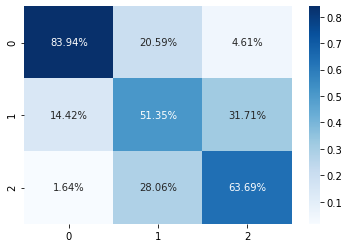

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


test Result:
CV - Accuracy : 0.64

CV - Precision: 0.66

CV - Recall: 0.64

CV - F1 score: 0.65

Confusion_matrix:
 [[643 188  64]
 [130 388 377]
 [ 11 201 683]]

Classif_report:
               precision    recall  f1-score   support

           0       0.82      0.72      0.77       895
           1       0.50      0.43      0.46       895
           2       0.61      0.76      0.68       895

    accuracy                           0.64      2685
   macro avg       0.64      0.64      0.64      2685
weighted avg       0.64      0.64      0.64      2685




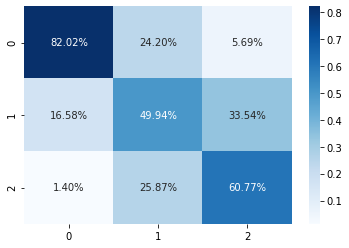

In [ ]:
print_scoresClassification(logreg_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(logreg_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Other Params

### Other Params: Analyse results - Slightly Overfitting 0.66 vs 0.64 but accuracy for class 1 is very low 0.5

In [ ]:
logreg_model2 = LogisticRegression(C=0.01)
logreg_model2.fit(X_train_sca, y_train)

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Train Result :
CV - Accuracy : 0.65

CV - Precision: 0.66

CV- Recall: 0.65

CV - F1 score: 0.65

Confusion_matrix:
 [[1201  363   98]
 [ 200  877  585]
 [  22  465 1175]]

Classif_report:
               precision    recall  f1-score   support

           0       0.84      0.72      0.78      1662
           1       0.51      0.53      0.52      1662
           2       0.63      0.71      0.67      1662

    accuracy                           0.65      4986
   macro avg       0.66      0.65      0.66      4986
weighted avg       0.66      0.65      0.66      4986




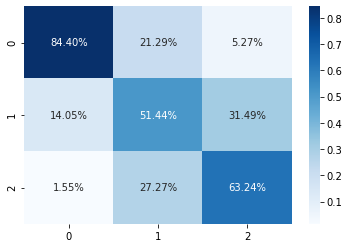

test Result:
CV - Accuracy : 0.64

CV - Precision: 0.66

CV - Recall: 0.63

CV - F1 score: 0.64

Confusion_matrix:
 [[631 219  45]
 [121 464 310]
 [ 12 256 627]]

Classif_report:
               precision    recall  f1-score   support

           0       0.83      0.71      0.76       895
           1       0.49      0.52      0.51       895
           2       0.64      0.70      0.67       895

    accuracy                           0.64      2685
   macro avg       0.65      0.64      0.64      2685
weighted avg       0.65      0.64      0.64      2685




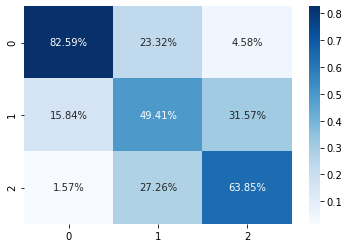

In [ ]:
print_scoresClassification(logreg_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(logreg_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Build model

In [ ]:
logreg_model3 = LogisticRegression(C=0.001)
logreg_model3.fit(X_train_sca, y_train)

LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Model Analyse results - No Overfitting 0.65 vs 0.64 but the accuracy for class 1 is very low 0.5

Train Result :
CV - Accuracy : 0.64

CV - Precision: 0.66

CV- Recall: 0.64

CV - F1 score: 0.64

Confusion_matrix:
 [[1121  411  130]
 [ 165  872  625]
 [  17  438 1207]]

Classif_report:
               precision    recall  f1-score   support

           0       0.86      0.67      0.76      1662
           1       0.51      0.52      0.52      1662
           2       0.62      0.73      0.67      1662

    accuracy                           0.64      4986
   macro avg       0.66      0.64      0.65      4986
weighted avg       0.66      0.64      0.65      4986




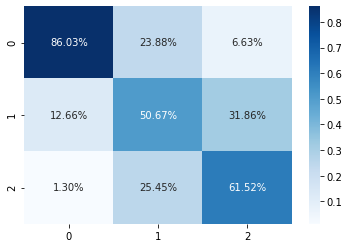

test Result:
CV - Accuracy : 0.63

CV - Precision: 0.66

CV - Recall: 0.63

CV - F1 score: 0.63

Confusion_matrix:
 [[595 240  60]
 [105 454 336]
 [  9 240 646]]

Classif_report:
               precision    recall  f1-score   support

           0       0.84      0.66      0.74       895
           1       0.49      0.51      0.50       895
           2       0.62      0.72      0.67       895

    accuracy                           0.63      2685
   macro avg       0.65      0.63      0.64      2685
weighted avg       0.65      0.63      0.64      2685




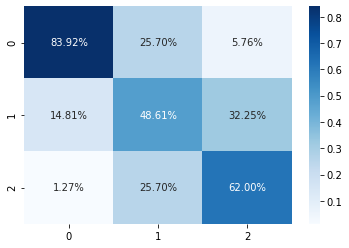

In [ ]:
print_scoresClassification(logreg_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(logreg_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)

## RANDOM FOREST

### Choose params

In [ ]:

#define parameter grid
param_grid = {'max_depth': [5, 10, 15, 20, 30, 40, 50], 'n_estimators': [10, 20, 30, 40, 50, 75]}
#create grid search estimator
grid_search_RF = GridSearchCV(RandomForestClassifier(), param_grid, cv=5, return_train_score=True)

In [ ]:
grid_search_RF.fit(X_train_sca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (grid_search_RF.best_score_,
    grid_search_RF.best_params_))
#print test score
print('Test score: {:.2f}'.format(grid_search_RF.score(X_test_sca, y_test)))

Best score: 0.80 using {'max_depth': 40, 'n_estimators': 50}
Test score: 0.80


### Build model

In [ ]:
rf_model1 = grid_search_RF.best_estimator_

rf_model1.fit(X_train_sca, y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=40, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
rf_model2 = RandomForestClassifier(
    max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=300)

rf_model2.fit(X_train_sca, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=3, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
rf_model3 = RandomForestClassifier(
    max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=100,verbose=2,n_jobs=-1)

rf_model3.fit(X_train_sca, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.1s


building tree 1 of 100
building tree 2 of 100
building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100
building tree 37 of 100
building tree 38 of 100
building tree 39 of 100
building tree 40 of 100building tree 41 of 100

building tree 42 of 100
b

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.3s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=3, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=2,
                       warm_start=False)

### Model1: Analyse results - Overfitting

Train Result :
CV - Accuracy : 0.80

CV - Precision: 0.81

CV- Recall: 0.80

CV - F1 score: 0.80

Confusion_matrix:
 [[1662    0    0]
 [   1 1661    0]
 [   0    0 1662]]

Classif_report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1662
           1       1.00      1.00      1.00      1662
           2       1.00      1.00      1.00      1662

    accuracy                           1.00      4986
   macro avg       1.00      1.00      1.00      4986
weighted avg       1.00      1.00      1.00      4986




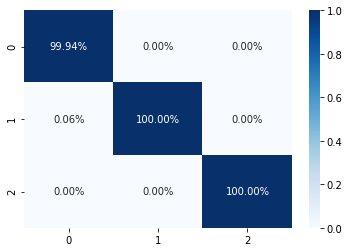

test Result:
CV - Accuracy : 0.76

CV - Precision: 0.77

CV - Recall: 0.76

CV - F1 score: 0.76

Confusion_matrix:
 [[674 192  29]
 [ 70 638 187]
 [  1  94 800]]

Classif_report:
               precision    recall  f1-score   support

           0       0.90      0.75      0.82       895
           1       0.69      0.71      0.70       895
           2       0.79      0.89      0.84       895

    accuracy                           0.79      2685
   macro avg       0.79      0.79      0.79      2685
weighted avg       0.79      0.79      0.79      2685




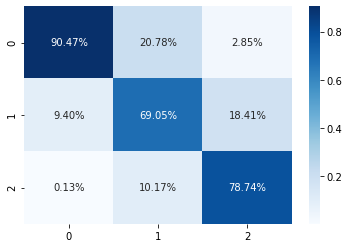

In [ ]:
print_scoresClassification(rf_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(rf_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model2: Analyse results - Slightly Overfitting, 0.66 vs 0.63 but the accuracy for class 1 is very low 0.5

Train Result :
CV - Accuracy : 0.65

CV - Precision: 0.68

CV- Recall: 0.65

CV - F1 score: 0.65

Confusion_matrix:
 [[1054  493  115]
 [  99  915  648]
 [   9  341 1312]]

Classif_report:
               precision    recall  f1-score   support

           0       0.91      0.63      0.75      1662
           1       0.52      0.55      0.54      1662
           2       0.63      0.79      0.70      1662

    accuracy                           0.66      4986
   macro avg       0.69      0.66      0.66      4986
weighted avg       0.69      0.66      0.66      4986




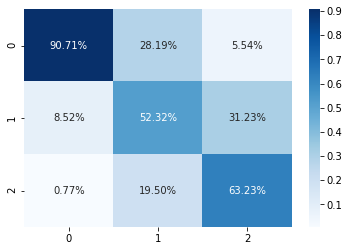

test Result:
CV - Accuracy : 0.64

CV - Precision: 0.68

CV - Recall: 0.64

CV - F1 score: 0.65

Confusion_matrix:
 [[488 342  65]
 [ 16 478 401]
 [  1 179 715]]

Classif_report:
               precision    recall  f1-score   support

           0       0.97      0.55      0.70       895
           1       0.48      0.53      0.50       895
           2       0.61      0.80      0.69       895

    accuracy                           0.63      2685
   macro avg       0.68      0.63      0.63      2685
weighted avg       0.68      0.63      0.63      2685




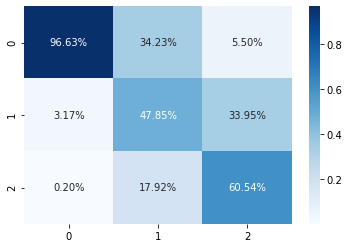

In [ ]:
print_scoresClassification(rf_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(rf_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model3: Analyse results - Slightly Overfitting 0.67 vs 0.64 but the accuracy for class 1 is very low 0.5

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.5s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent work

Train Result :
CV - Accuracy : 0.65

CV - Precision: 0.68

CV- Recall: 0.65

CV - F1 score: 0.65

Confusion_matrix:
 [[1073  477  112]
 [  98  930  634]
 [   8  361 1293]]

Classif_report:
               precision    recall  f1-score   support

           0       0.91      0.65      0.76      1662
           1       0.53      0.56      0.54      1662
           2       0.63      0.78      0.70      1662

    accuracy                           0.66      4986
   macro avg       0.69      0.66      0.67      4986
weighted avg       0.69      0.66      0.67      4986




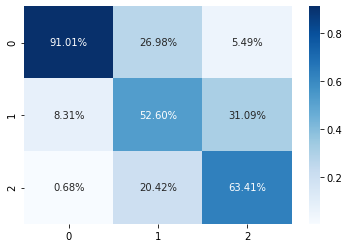

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0

test Result:
CV - Accuracy : 0.64

CV - Precision: 0.67

CV - Recall: 0.64

CV - F1 score: 0.64

Confusion_matrix:
 [[481 344  70]
 [ 18 470 407]
 [  0 176 719]]

Classif_report:
               precision    recall  f1-score   support

           0       0.96      0.54      0.69       895
           1       0.47      0.53      0.50       895
           2       0.60      0.80      0.69       895

    accuracy                           0.62      2685
   macro avg       0.68      0.62      0.63      2685
weighted avg       0.68      0.62      0.63      2685




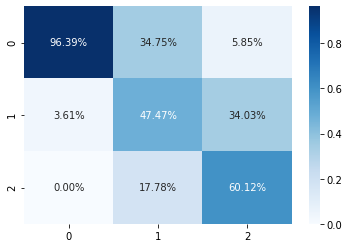

In [ ]:
print_scoresClassification(rf_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(rf_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)

## KNN

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

### Choose params

In [ ]:
#define parameter grid
param_grid = {'n_neighbors': np.arange(1,12)}
#create grid search estimator
grid_search_KNN = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, return_train_score=True)

In [ ]:
#fit estimator on training set
grid_search_KNN.fit(X_train_sca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (grid_search_KNN.best_score_,
    grid_search_KNN.best_params_))
#print test score
print('Test score: {:.2f}'.format(grid_search_KNN.score(X_test_sca, y_test)))

Best score: 0.78 using {'n_neighbors': 1}
Test score: 0.80


### Build model

In [ ]:
# Build the model with the best parameters
knn_model1 = grid_search_KNN.best_estimator_
#fit the model
knn_model1 = knn_model1.fit(X_train_sca, y_train)

In [ ]:
knn_model2 = KNeighborsClassifier(n_neighbors=5)

knn_model2.fit(X_train_sca, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [ ]:
knn_model3 = KNeighborsClassifier(n_neighbors=3)

knn_model3.fit(X_train_sca, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

### Model1: Analyse results - Overfitting




Train Result :
CV - Accuracy : 0.79

CV - Precision: 0.79

CV- Recall: 0.79

CV - F1 score: 0.79

Confusion_matrix:
 [[1662    0    0]
 [   0 1662    0]
 [   0    0 1662]]

Classif_report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1662
           1       1.00      1.00      1.00      1662
           2       1.00      1.00      1.00      1662

    accuracy                           1.00      4986
   macro avg       1.00      1.00      1.00      4986
weighted avg       1.00      1.00      1.00      4986




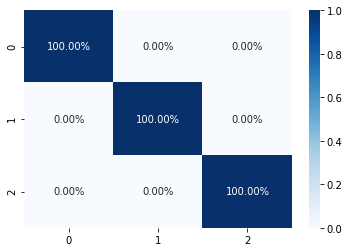

test Result:
CV - Accuracy : 0.74

CV - Precision: 0.74

CV - Recall: 0.74

CV - F1 score: 0.74

Confusion_matrix:
 [[710 139  46]
 [130 621 144]
 [  7  67 821]]

Classif_report:
               precision    recall  f1-score   support

           0       0.84      0.79      0.82       895
           1       0.75      0.69      0.72       895
           2       0.81      0.92      0.86       895

    accuracy                           0.80      2685
   macro avg       0.80      0.80      0.80      2685
weighted avg       0.80      0.80      0.80      2685




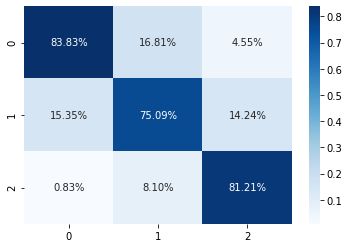

In [ ]:
print_scoresClassification(knn_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(knn_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model2: Analyse results - Overfitting

Train Result :
CV - Accuracy : 0.72

CV - Precision: 0.72

CV- Recall: 0.72

CV - F1 score: 0.72

Confusion_matrix:
 [[1389  214   59]
 [ 183 1221  258]
 [  24  136 1502]]

Classif_report:
               precision    recall  f1-score   support

           0       0.87      0.84      0.85      1662
           1       0.78      0.73      0.76      1662
           2       0.83      0.90      0.86      1662

    accuracy                           0.82      4986
   macro avg       0.82      0.82      0.82      4986
weighted avg       0.82      0.82      0.82      4986




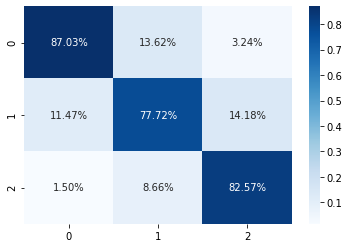

test Result:
CV - Accuracy : 0.69

CV - Precision: 0.69

CV - Recall: 0.69

CV - F1 score: 0.69

Confusion_matrix:
 [[686 159  50]
 [173 526 196]
 [ 13 132 750]]

Classif_report:
               precision    recall  f1-score   support

           0       0.79      0.77      0.78       895
           1       0.64      0.59      0.61       895
           2       0.75      0.84      0.79       895

    accuracy                           0.73      2685
   macro avg       0.73      0.73      0.73      2685
weighted avg       0.73      0.73      0.73      2685




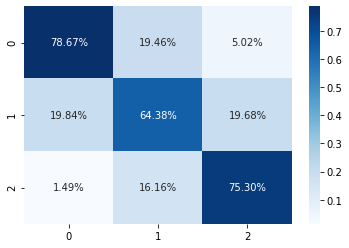

In [ ]:
print_scoresClassification(knn_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(knn_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model3: Analyse results - Overfitting

Train Result :
CV - Accuracy : 0.74

CV - Precision: 0.73

CV- Recall: 0.74

CV - F1 score: 0.73

Confusion_matrix:
 [[1480  134   48]
 [ 145 1332  185]
 [  20   64 1578]]

Classif_report:
               precision    recall  f1-score   support

           0       0.90      0.89      0.90      1662
           1       0.87      0.80      0.83      1662
           2       0.87      0.95      0.91      1662

    accuracy                           0.88      4986
   macro avg       0.88      0.88      0.88      4986
weighted avg       0.88      0.88      0.88      4986




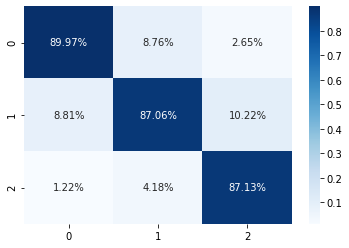

test Result:
CV - Accuracy : 0.71

CV - Precision: 0.70

CV - Recall: 0.71

CV - F1 score: 0.70

Confusion_matrix:
 [[695 153  47]
 [184 520 191]
 [ 22  96 777]]

Classif_report:
               precision    recall  f1-score   support

           0       0.77      0.78      0.77       895
           1       0.68      0.58      0.63       895
           2       0.77      0.87      0.81       895

    accuracy                           0.74      2685
   macro avg       0.74      0.74      0.74      2685
weighted avg       0.74      0.74      0.74      2685




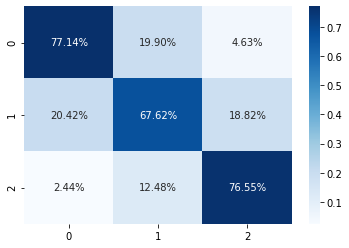

In [ ]:
print_scoresClassification(knn_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(knn_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)

## SVM

In [ ]:
from sklearn import svm
from sklearn.svm import SVC

### Choose params

In [ ]:
#define parameter grid
C_parameters = {'C' : [0.001, 0.01, 0.1, 1, 10, 100]}
#create grid search estimator
svc_grid_search = GridSearchCV(SVC(), param_grid=C_parameters, cv=5,return_train_score=True)

In [ ]:
#Train the model using the training sets 
svc_grid_search.fit(X_train_sca,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (svc_grid_search.best_score_,
    svc_grid_search.best_params_))
#print test score
print('Test score: {:.2f}'.format(svc_grid_search.score(X_test_sca, y_test)))

Best score: 0.74 using {'C': 100}
Test score: 0.75


### Build model

In [ ]:
svc_model1 = svc_grid_search.best_estimator_
svc_model1.fit(X_train_sca, y_train)

SVC(C=100, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [ ]:
svc_model2 = SVC(C=0.001,probability=True)

svc_model2.fit(X_train_sca, y_train)

SVC(C=0.001, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [ ]:
svc_model3 = SVC(C=10,probability=True)

svc_model3.fit(X_train_sca, y_train)

SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

### Model1: Analyse results - Overfitting

Train Result :
CV - Accuracy : 0.74

CV - Precision: 0.74

CV- Recall: 0.74

CV - F1 score: 0.74

Confusion_matrix:
 [[1488  140   34]
 [ 112 1286  264]
 [  13  144 1505]]

Classif_report:
               precision    recall  f1-score   support

           0       0.92      0.90      0.91      1662
           1       0.82      0.77      0.80      1662
           2       0.83      0.91      0.87      1662

    accuracy                           0.86      4986
   macro avg       0.86      0.86      0.86      4986
weighted avg       0.86      0.86      0.86      4986




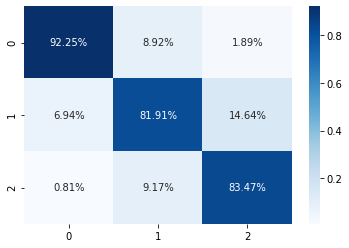

test Result:
CV - Accuracy : 0.72

CV - Precision: 0.72

CV - Recall: 0.72

CV - F1 score: 0.72

Confusion_matrix:
 [[722 139  34]
 [162 551 182]
 [ 19 129 747]]

Classif_report:
               precision    recall  f1-score   support

           0       0.80      0.81      0.80       895
           1       0.67      0.62      0.64       895
           2       0.78      0.83      0.80       895

    accuracy                           0.75      2685
   macro avg       0.75      0.75      0.75      2685
weighted avg       0.75      0.75      0.75      2685




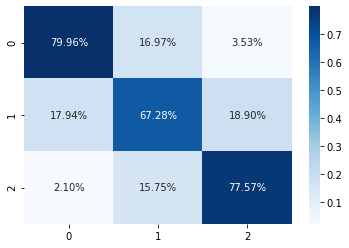

In [ ]:
print_scoresClassification(svc_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(svc_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model2: Analyse results - No overfitting 0.63 but the accuracy for class 1 is very low 0.52

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Pr

Train Result :
CV - Accuracy : 0.55

CV - Precision: 0.48

CV- Recall: 0.55

CV - F1 score: 0.50

Confusion_matrix:
 [[1017  507  138]
 [ 128  919  615]
 [  38  446 1178]]

Classif_report:
               precision    recall  f1-score   support

           0       0.86      0.61      0.71      1662
           1       0.49      0.55      0.52      1662
           2       0.61      0.71      0.66      1662

    accuracy                           0.62      4986
   macro avg       0.65      0.62      0.63      4986
weighted avg       0.65      0.62      0.63      4986




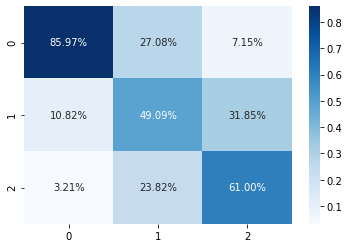

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Pr

test Result:
CV - Accuracy : 0.44

CV - Precision: 0.25

CV - Recall: 0.44

CV - F1 score: 0.30

Confusion_matrix:
 [[563 264  68]
 [ 76 486 333]
 [ 23 237 635]]

Classif_report:
               precision    recall  f1-score   support

           0       0.85      0.63      0.72       895
           1       0.49      0.54      0.52       895
           2       0.61      0.71      0.66       895

    accuracy                           0.63      2685
   macro avg       0.65      0.63      0.63      2685
weighted avg       0.65      0.63      0.63      2685




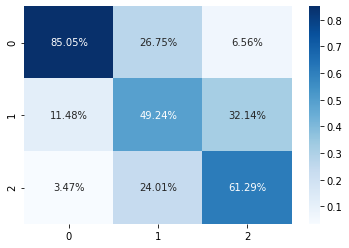

In [ ]:
print_scoresClassification(svc_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(svc_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model3: Analyse results - Slightly Overfitting 0.78 vs 0.72, the accuracy for class 1 improved 0.6

# ML - Orignal Target

Train Result :
CV - Accuracy : 0.72

CV - Precision: 0.72

CV- Recall: 0.72

CV - F1 score: 0.72

Confusion_matrix:
 [[1357  265   40]
 [ 148 1140  374]
 [  16  239 1407]]

Classif_report:
               precision    recall  f1-score   support

           0       0.89      0.82      0.85      1662
           1       0.69      0.69      0.69      1662
           2       0.77      0.85      0.81      1662

    accuracy                           0.78      4986
   macro avg       0.79      0.78      0.78      4986
weighted avg       0.79      0.78      0.78      4986




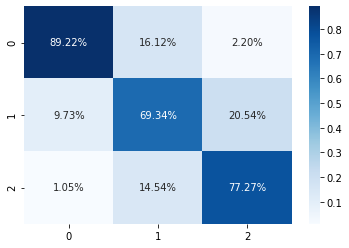

test Result:
CV - Accuracy : 0.71

CV - Precision: 0.71

CV - Recall: 0.71

CV - F1 score: 0.71

Confusion_matrix:
 [[693 177  25]
 [139 529 227]
 [ 17 160 718]]

Classif_report:
               precision    recall  f1-score   support

           0       0.82      0.77      0.79       895
           1       0.61      0.59      0.60       895
           2       0.74      0.80      0.77       895

    accuracy                           0.72      2685
   macro avg       0.72      0.72      0.72      2685
weighted avg       0.72      0.72      0.72      2685




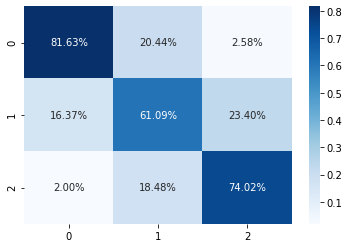

In [ ]:
print_scoresClassification(svc_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(svc_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)

## Split data - original quality

In [ ]:
# from original target
selected= selected.sample(frac=1)
X2 = selected.drop(['quality3_coded','quality','quality_coded','butter type','bake temp'], axis=1)
y2 = selected.quality

In [ ]:
# split test and train
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.35, random_state=0, stratify=y2)


### Transform data - original quality

In [ ]:
from sklearn.preprocessing import StandardScaler

X_train_sca2 = StandardScaler().fit_transform(X_train2)
X_test_sca2 = StandardScaler().fit_transform(X_test2)

## KNN

### Choose params

In [ ]:
#define parameter grid
param_grid = {'n_neighbors': np.arange(1,12)}
#create grid search estimator
grid_search_KNN2 = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, return_train_score=True)

In [ ]:
#fit estimator on training set
grid_search_KNN2.fit(X_train_sca2, y_train2)

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)


GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (grid_search_KNN2.best_score_,
    grid_search_KNN2.best_params_))
#print test score
print('Test score: {:.2f}'.format(grid_search_KNN2.score(X_test_sca2, y_test2)))

Best score: 0.54 using {'n_neighbors': 1}
Test score: 0.57


### Build model

In [ ]:
# Build the model with the best parameters
knn_model4 = grid_search_KNN2.best_estimator_
#fit the model
knn_model4 = knn_model1.fit(X_train_sca2, y_train2)

### Model4: Analyse results - Error: too many classes

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted sampl

Train Result :
CV - Accuracy : 0.55

CV - Precision: 0.43

CV- Recall: 0.41

CV - F1 score: 0.42

Confusion_matrix:
 [[   5    0    0    0    0    0    0    0    0]
 [   0   29    0    0    0    0    0    0    0]
 [   0    0  374    0    0    0    0    0    0]
 [   0    0    0  399    0    0    0    0    0]
 [   0    0    0    0  855    0    0    0    0]
 [   0    0    0    0    0 1155    0    0    0]
 [   0    0    0    0    0    0  459    0    0]
 [   0    0    0    0    0    0    0   88    0]
 [   0    0    0    0    0    0    0    0    3]]

Classif_report:
               precision    recall  f1-score   support

           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00        29
           5       1.00      1.00      1.00       374
           6       1.00      1.00      1.00       399
           7       1.00      1.00      1.00       855
           8       1.00      1.00      1.00      1155
           9       1.00      1.00      1.00       459

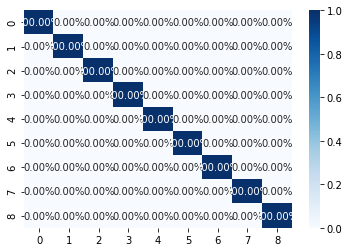

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 2 members, which is less than n_splits=10.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted sampl

test Result:
CV - Accuracy : 0.53

CV - Precision: 0.40

CV - Recall: 0.41

CV - F1 score: 0.40

Confusion_matrix:
 [[  0   1   1   1   0   0   0   0   0]
 [  1   0   8   6   0   0   0   0   0]
 [  3   4 122  55  14   1   1   1   0]
 [  0   4  36 107  41  20   6   1   0]
 [  0   0   7  26 277 117  30   4   0]
 [  0   0   0   9 131 386  82  15   0]
 [  0   0   0   0  17  89 135   6   0]
 [  0   0   0   1   0  20  13  13   0]
 [  0   0   0   0   0   1   1   0   0]]

Classif_report:
               precision    recall  f1-score   support

           3       0.00      0.00      0.00         3
           4       0.00      0.00      0.00        15
           5       0.70      0.61      0.65       201
           6       0.52      0.50      0.51       215
           7       0.58      0.60      0.59       461
           8       0.61      0.62      0.61       623
           9       0.50      0.55      0.52       247
          10       0.33      0.28      0.30        47
          11       0.00    

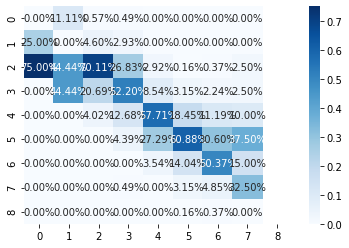

In [ ]:
print_scoresClassification(knn_model4, X_train_sca2, y_train2, X_test_sca2, y_test2, train=True)
print_scoresClassification(knn_model4, X_train_sca2, y_train2, X_test_sca2, y_test2, train=False)

# ML - Target: 2 classes

Models to use:
- Log reg
- KNN
- Random Forest
- SVM

## ML Libraries

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression, LogisticRegression

from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_validate
from sklearn import metrics
from sklearn.metrics import r2_score,accuracy_score, confusion_matrix, precision_score, recall_score, f1_score

## Model scoring function

In [ ]:
from sklearn.metrics import roc_auc_score, f1_score, confusion_matrix, roc_curve, auc, classification_report

def print_scoresClassification(model, X_train, y_train, X_test, y_test, train=True):
    from sklearn.metrics import classification_report
    scoring = {'acc': 'accuracy',
           'prec_macro': 'precision_macro',
           'rec_macro': 'recall_macro',
           'f1_macro': 'f1_macro'}
    
    if train:
        scores = cross_validate(model, X_train, y_train, cv=10, scoring=scoring)
        ypredTrain = model.predict(X_train)
        Acc_train = scores['test_acc'].mean()
        Precision_train = scores['test_prec_macro'].mean()
        Recall_train = scores['test_rec_macro'].mean()
        F1_train = scores['test_f1_macro'].mean()
        conf_matrix_train = confusion_matrix(y_train, ypredTrain)
        class_report = classification_report(y_train, ypredTrain)
        
        print("Train Result :\n===========================================")
        print(f"CV - Accuracy : {Acc_train:.2f}\n")
        print(f"CV - Precision: {Precision_train:.2f}\n")
        print(f"CV- Recall: {Recall_train:.2f}\n")
        print(f"CV - F1 score: {F1_train:.2f}\n")    
        print(f"Confusion_matrix:\n {conf_matrix_train}\n") 
        print(f"Classif_report:\n {class_report}\n")
        sns.heatmap(conf_matrix_train/conf_matrix_train.sum(axis=0), annot=True, fmt='.2%', cmap='Blues')
        plt.show()
        

       
    elif train==False:
        scores = cross_validate(model, X_test, y_test, cv=10, scoring=scoring)
        ypredtest = model.predict(X_test)
        Acc_test = scores['test_acc'].mean()
        Precision_test = scores['test_prec_macro'].mean()
        Recall_test = scores['test_rec_macro'].mean()
        F1_test = scores['test_f1_macro'].mean()
        conf_matrix_test = confusion_matrix(y_test, ypredtest)
        class_report = classification_report(y_test, ypredtest)
        
        print("test Result:\n===========================================")
        print(f"CV - Accuracy : {Acc_test:.2f}\n")
        print(f"CV - Precision: {Precision_test:.2f}\n")
        print(f"CV - Recall: {Recall_test:.2f}\n")
        print(f"CV - F1 score: {F1_test:.2f}\n")    
        print(f"Confusion_matrix:\n {conf_matrix_test}\n")
        print(f"Classif_report:\n {class_report}\n")
        sns.heatmap(conf_matrix_test/conf_matrix_test.sum(axis=0), annot=True, fmt='.2%', cmap='Blues')
        plt.show()
        
        
        y_pred=model.predict(X_test)
        # roc_curve
        Y_pred_prob = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, Y_pred_prob)
        AUC_score = roc_auc_score(y_test, y_pred)
        print("AUC score: {:.2f}".format(AUC_score))
        plt.figure(figsize=(12,5))
        plt.plot([0, 1], [0, 1], 'k--', label='reference line')
        plt.plot(fpr, tpr, label=model)
        plt.xlabel('False positive rate')
        plt.ylabel('True positive rate')
        plt.title(model)
        plt.legend(loc='best')
        plt.show()

## Split data

In [ ]:
selected.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5181 entries, 3208 to 4339
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype   
---  ------                                 --------------  -----   
 0   sugar to flour ratio                   5181 non-null   float64 
 1   sugar index                            5181 non-null   float64 
 2   bake temp                              5181 non-null   int64   
 3   chill time                             5181 non-null   float64 
 4   calories                               5181 non-null   float64 
 5   pH                                     5181 non-null   float64 
 6   grams baking soda                      5181 non-null   float64 
 7   bake time                              5181 non-null   float64 
 8   quality                                5181 non-null   category
 9   butter type                            5181 non-null   object  
 10  weight                                 5181 non-null   fl

In [ ]:
from sklearn.model_selection import train_test_split
selected= selected.sample(frac=1)
X3 = selected.drop(['quality3_coded','quality','quality_coded','butter type','bake temp'], axis=1)
y3 = selected.quality_coded

### Transform data

In [ ]:
# split test and train
X_train, X_test, y_train, y_test = train_test_split(X3, y3, test_size=0.35, random_state=0, stratify=y3)


In [ ]:
from sklearn.preprocessing import StandardScaler

X_train_sca = StandardScaler().fit_transform(X_train)
X_test_sca = StandardScaler().fit_transform(X_test)

## LOGISTIC REGRESSION

### Choose params

In [ ]:
#define parameter grid
param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000] }
#create grid search estimator
grid_search_LogReg = GridSearchCV(LogisticRegression(), param_grid, cv=5, return_train_score=True)

In [ ]:
grid_search_LogReg.fit(X_train_sca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (grid_search_LogReg.best_score_,
    grid_search_LogReg.best_params_))
#print test score
print('Test score: {:.2f}'.format(grid_search_LogReg.score(X_test_sca, y_test)))

Best score: 0.81 using {'C': 10}
Test score: 0.80


### Build model

In [ ]:
logreg_model1 = grid_search_LogReg.best_estimator_
logreg_model1.fit(X_train_sca, y_train)

LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
logreg_model2 = LogisticRegression(C=0.01)
logreg_model2.fit(X_train_sca, y_train)

LogisticRegression(C=0.01, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
logreg_model3 = LogisticRegression(C=0.001)
logreg_model3.fit(X_train_sca, y_train)

LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### Model1: Analyse results - Slightly Overfitting 0.82 vs 0.80, Class 1 is better than Class 0

Train Result :
CV - Accuracy : 0.81

CV - Precision: 0.82

CV- Recall: 0.81

CV - F1 score: 0.81

Confusion_matrix:
 [[1267  395]
 [ 222 1483]]

Classif_report:
               precision    recall  f1-score   support

           0       0.85      0.76      0.80      1662
           1       0.79      0.87      0.83      1705

    accuracy                           0.82      3367
   macro avg       0.82      0.82      0.82      3367
weighted avg       0.82      0.82      0.82      3367




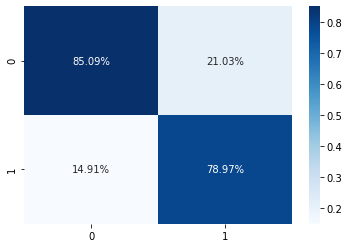

test Result:
CV - Accuracy : 0.79

CV - Precision: 0.80

CV - Recall: 0.79

CV - F1 score: 0.79

Confusion_matrix:
 [[677 218]
 [141 778]]

Classif_report:
               precision    recall  f1-score   support

           0       0.83      0.76      0.79       895
           1       0.78      0.85      0.81       919

    accuracy                           0.80      1814
   macro avg       0.80      0.80      0.80      1814
weighted avg       0.80      0.80      0.80      1814




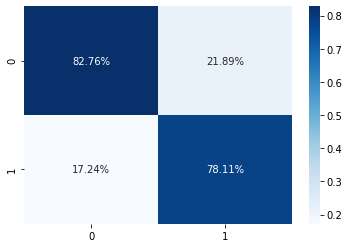

AUC score: 0.80


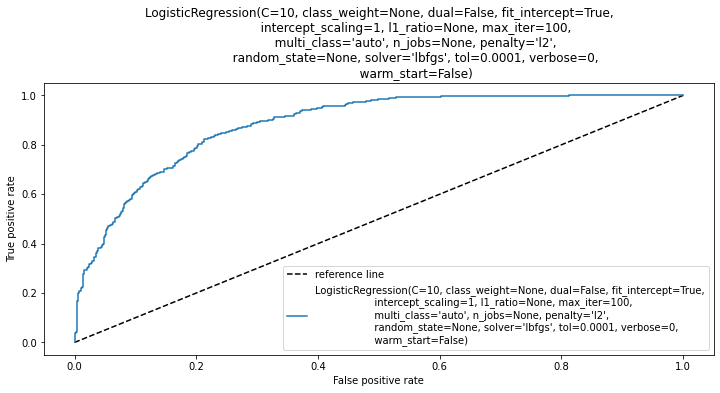

In [ ]:
print_scoresClassification(logreg_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(logreg_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model2: Analyse results - Slightly Underfitting 0.79 vs 0.81, Calss 1 is better than Calss 0 

Train Result :
CV - Accuracy : 0.81

CV - Precision: 0.82

CV- Recall: 0.81

CV - F1 score: 0.81

Confusion_matrix:
 [[1209  453]
 [ 188 1517]]

Classif_report:
               precision    recall  f1-score   support

           0       0.87      0.73      0.79      1662
           1       0.77      0.89      0.83      1705

    accuracy                           0.81      3367
   macro avg       0.82      0.81      0.81      3367
weighted avg       0.82      0.81      0.81      3367




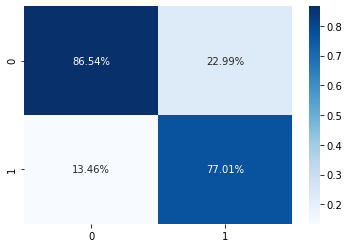

test Result:
CV - Accuracy : 0.79

CV - Precision: 0.80

CV - Recall: 0.78

CV - F1 score: 0.78

Confusion_matrix:
 [[636 259]
 [127 792]]

Classif_report:
               precision    recall  f1-score   support

           0       0.83      0.71      0.77       895
           1       0.75      0.86      0.80       919

    accuracy                           0.79      1814
   macro avg       0.79      0.79      0.79      1814
weighted avg       0.79      0.79      0.79      1814




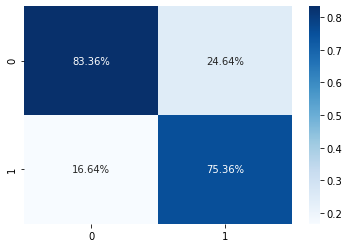

AUC score: 0.79


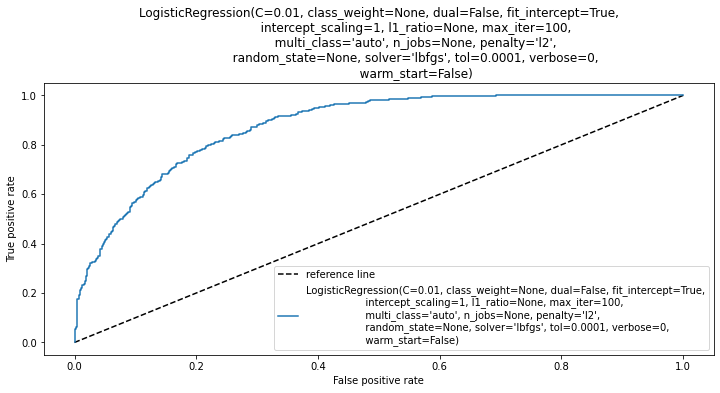

In [ ]:
print_scoresClassification(logreg_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(logreg_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model3: Analyse results - Slightly Overfitting 0.80 vs 0.78, Class 1 is better

Train Result :
CV - Accuracy : 0.80

CV - Precision: 0.82

CV- Recall: 0.80

CV - F1 score: 0.80

Confusion_matrix:
 [[1114  548]
 [ 124 1581]]

Classif_report:
               precision    recall  f1-score   support

           0       0.90      0.67      0.77      1662
           1       0.74      0.93      0.82      1705

    accuracy                           0.80      3367
   macro avg       0.82      0.80      0.80      3367
weighted avg       0.82      0.80      0.80      3367




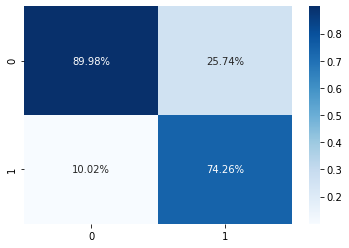

test Result:
CV - Accuracy : 0.78

CV - Precision: 0.81

CV - Recall: 0.77

CV - F1 score: 0.77

Confusion_matrix:
 [[579 316]
 [ 82 837]]

Classif_report:
               precision    recall  f1-score   support

           0       0.88      0.65      0.74       895
           1       0.73      0.91      0.81       919

    accuracy                           0.78      1814
   macro avg       0.80      0.78      0.78      1814
weighted avg       0.80      0.78      0.78      1814




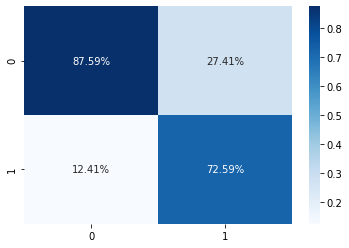

AUC score: 0.78


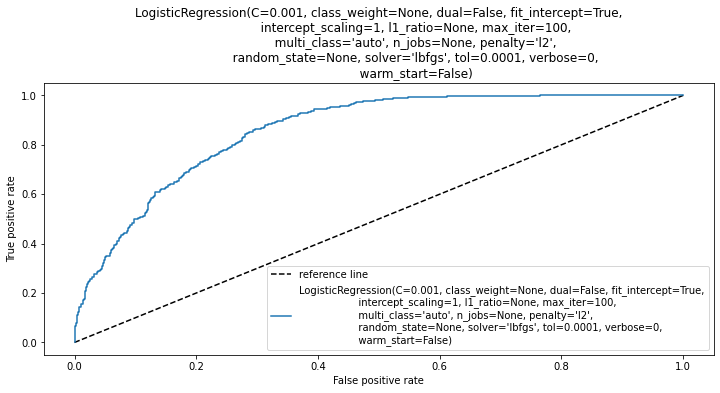

In [ ]:
print_scoresClassification(logreg_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(logreg_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)

## RANDOM FOREST

### Choose params

In [ ]:

#define parameter grid
param_grid = {'max_depth': [5, 10, 15, 20, 30, 40, 50], 'n_estimators': [10, 20, 30, 40, 50, 75]}
#create grid search estimator
grid_search_RF = GridSearchCV(RandomForestClassifier(), param_grid, cv=5, return_train_score=True)

In [ ]:
grid_search_RF.fit(X_train_sca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (grid_search_RF.best_score_,
    grid_search_RF.best_params_))
#print test score
print('Test score: {:.2f}'.format(grid_search_RF.score(X_test_sca, y_test)))

Best score: 0.86 using {'max_depth': 30, 'n_estimators': 50}
Test score: 0.84


In [ ]:
rf_model1 = grid_search_RF.best_estimator_

rf_model1.fit(X_train_sca, y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=30, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

### Best Params: Overfitting

Train Result :
CV - Accuracy : 0.86

CV - Precision: 0.86

CV- Recall: 0.86

CV - F1 score: 0.86

Confusion_matrix:
 [[1662    0]
 [   0 1705]]

Classif_report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1662
           1       1.00      1.00      1.00      1705

    accuracy                           1.00      3367
   macro avg       1.00      1.00      1.00      3367
weighted avg       1.00      1.00      1.00      3367




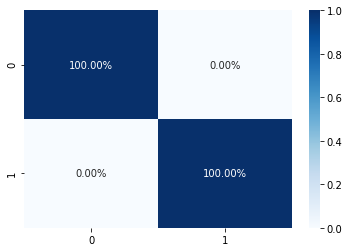

test Result:
CV - Accuracy : 0.83

CV - Precision: 0.84

CV - Recall: 0.83

CV - F1 score: 0.83

Confusion_matrix:
 [[727 168]
 [119 800]]

Classif_report:
               precision    recall  f1-score   support

           0       0.86      0.81      0.84       895
           1       0.83      0.87      0.85       919

    accuracy                           0.84      1814
   macro avg       0.84      0.84      0.84      1814
weighted avg       0.84      0.84      0.84      1814




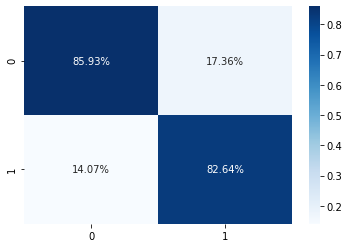

AUC score: 0.84


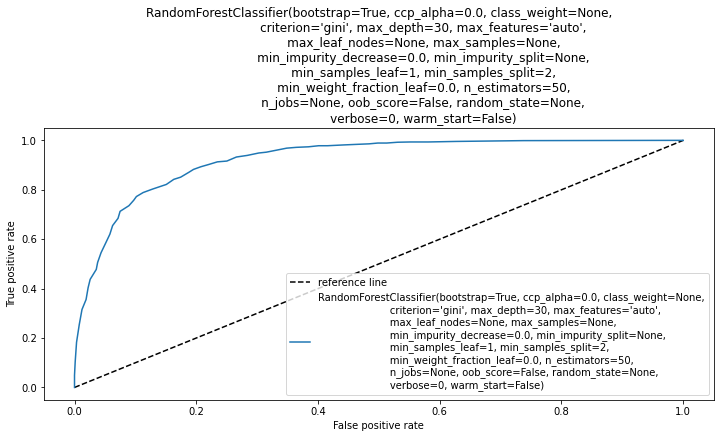

In [ ]:
print_scoresClassification(rf_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(rf_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Try Params: Slightly Overfitting 0.78 vs 0.75

In [ ]:
rf_model3 = RandomForestClassifier(
    max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=100,verbose=2,n_jobs=-1)

rf_model3.fit(X_train_sca, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.1s


building tree 1 of 100building tree 2 of 100

building tree 3 of 100
building tree 4 of 100
building tree 5 of 100
building tree 6 of 100
building tree 7 of 100
building tree 8 of 100
building tree 9 of 100
building tree 10 of 100
building tree 11 of 100
building tree 12 of 100
building tree 13 of 100
building tree 14 of 100
building tree 15 of 100
building tree 16 of 100
building tree 17 of 100
building tree 18 of 100
building tree 19 of 100
building tree 20 of 100
building tree 21 of 100
building tree 22 of 100
building tree 23 of 100
building tree 24 of 100
building tree 25 of 100
building tree 26 of 100
building tree 27 of 100
building tree 28 of 100
building tree 29 of 100
building tree 30 of 100
building tree 31 of 100
building tree 32 of 100
building tree 33 of 100
building tree 34 of 100
building tree 35 of 100
building tree 36 of 100building tree 37 of 100

building tree 38 of 100
building tree 39 of 100
building tree 40 of 100
building tree 41 of 100
building tree 42 of 100
b

[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=3, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=2,
                       warm_start=False)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent work

Train Result :
CV - Accuracy : 0.78

CV - Precision: 0.83

CV- Recall: 0.78

CV - F1 score: 0.77

Confusion_matrix:
 [[ 987  675]
 [  46 1659]]

Classif_report:
               precision    recall  f1-score   support

           0       0.96      0.59      0.73      1662
           1       0.71      0.97      0.82      1705

    accuracy                           0.79      3367
   macro avg       0.83      0.78      0.78      3367
weighted avg       0.83      0.79      0.78      3367




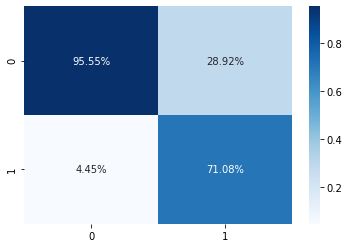

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0

test Result:
CV - Accuracy : 0.76

CV - Precision: 0.81

CV - Recall: 0.75

CV - F1 score: 0.75

Confusion_matrix:
 [[498 397]
 [ 38 881]]

Classif_report:
               precision    recall  f1-score   support

           0       0.93      0.56      0.70       895
           1       0.69      0.96      0.80       919

    accuracy                           0.76      1814
   macro avg       0.81      0.76      0.75      1814
weighted avg       0.81      0.76      0.75      1814




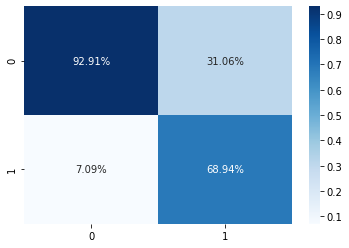

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished


AUC score: 0.76


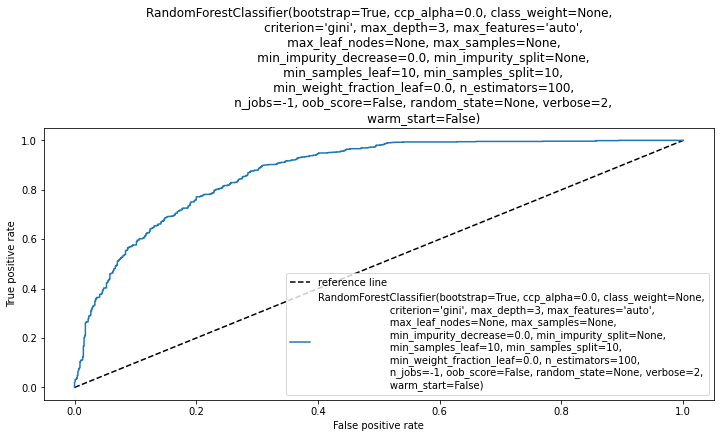

In [ ]:
print_scoresClassification(rf_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(rf_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Build model

In [ ]:
rf_model2 = RandomForestClassifier(
    max_depth=3, min_samples_leaf=10, min_samples_split=10, n_estimators=300)

rf_model2.fit(X_train_sca, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=3, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=300,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

### Model2: Analyse results - Slightly Overfitting, 0.78 vs 0.75, Class 1 is better

Train Result :
CV - Accuracy : 0.78

CV - Precision: 0.83

CV- Recall: 0.78

CV - F1 score: 0.77

Confusion_matrix:
 [[ 986  676]
 [  43 1662]]

Classif_report:
               precision    recall  f1-score   support

           0       0.96      0.59      0.73      1662
           1       0.71      0.97      0.82      1705

    accuracy                           0.79      3367
   macro avg       0.83      0.78      0.78      3367
weighted avg       0.83      0.79      0.78      3367




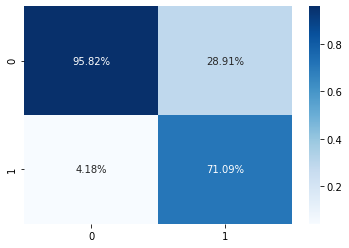

test Result:
CV - Accuracy : 0.76

CV - Precision: 0.81

CV - Recall: 0.76

CV - F1 score: 0.75

Confusion_matrix:
 [[496 399]
 [ 38 881]]

Classif_report:
               precision    recall  f1-score   support

           0       0.93      0.55      0.69       895
           1       0.69      0.96      0.80       919

    accuracy                           0.76      1814
   macro avg       0.81      0.76      0.75      1814
weighted avg       0.81      0.76      0.75      1814




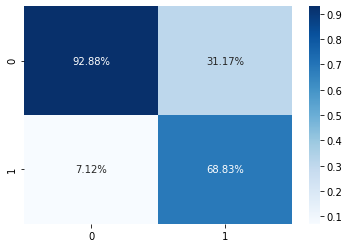

AUC score: 0.76


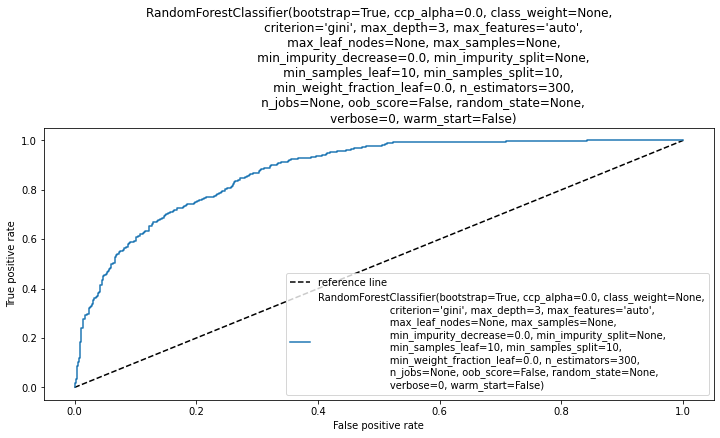

In [ ]:
print_scoresClassification(rf_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(rf_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

## KNN

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

### Choose params

In [ ]:
#define parameter grid
param_grid = {'n_neighbors': np.arange(1,12)}
#create grid search estimator
grid_search_KNN = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5, return_train_score=True)

In [ ]:
#fit estimator on training set
grid_search_KNN.fit(X_train_sca, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (grid_search_KNN.best_score_,
    grid_search_KNN.best_params_))
#print test score
print('Test score: {:.2f}'.format(grid_search_KNN.score(X_test_sca, y_test)))

Best score: 0.82 using {'n_neighbors': 9}
Test score: 0.80


### Best Params: Analyse results - Overfitting 0.85 vs 0.80




In [ ]:
# Build the model with the best parameters
knn_model1 = grid_search_KNN.best_estimator_
#fit the model
knn_model1 = knn_model1.fit(X_train_sca, y_train)

Train Result :
CV - Accuracy : 0.81

CV - Precision: 0.82

CV- Recall: 0.81

CV - F1 score: 0.81

Confusion_matrix:
 [[1335  327]
 [ 193 1512]]

Classif_report:
               precision    recall  f1-score   support

           0       0.87      0.80      0.84      1662
           1       0.82      0.89      0.85      1705

    accuracy                           0.85      3367
   macro avg       0.85      0.85      0.85      3367
weighted avg       0.85      0.85      0.85      3367




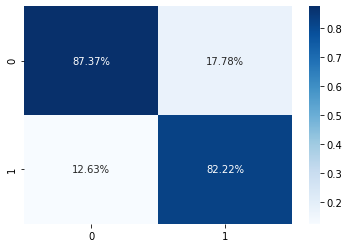

test Result:
CV - Accuracy : 0.80

CV - Precision: 0.80

CV - Recall: 0.80

CV - F1 score: 0.80

Confusion_matrix:
 [[685 210]
 [159 760]]

Classif_report:
               precision    recall  f1-score   support

           0       0.81      0.77      0.79       895
           1       0.78      0.83      0.80       919

    accuracy                           0.80      1814
   macro avg       0.80      0.80      0.80      1814
weighted avg       0.80      0.80      0.80      1814




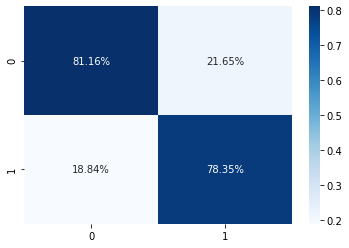

AUC score: 0.80


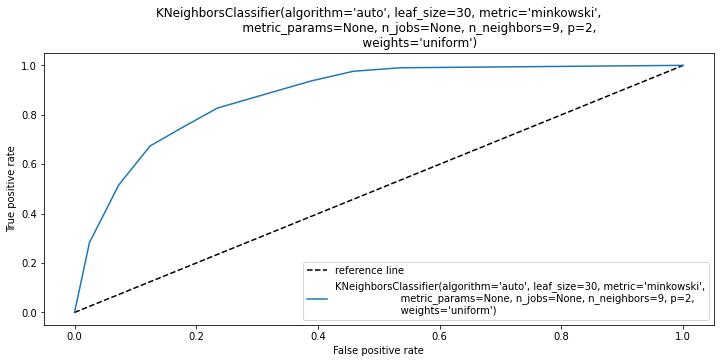

In [ ]:
print_scoresClassification(knn_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(knn_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Other Params

### Other Params:  Overfitting 0.87 vs 0.80

In [ ]:
knn_model2 = KNeighborsClassifier(n_neighbors=5)

knn_model2.fit(X_train_sca, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

Train Result :
CV - Accuracy : 0.81

CV - Precision: 0.82

CV- Recall: 0.81

CV - F1 score: 0.81

Confusion_matrix:
 [[1394  268]
 [ 166 1539]]

Classif_report:
               precision    recall  f1-score   support

           0       0.89      0.84      0.87      1662
           1       0.85      0.90      0.88      1705

    accuracy                           0.87      3367
   macro avg       0.87      0.87      0.87      3367
weighted avg       0.87      0.87      0.87      3367




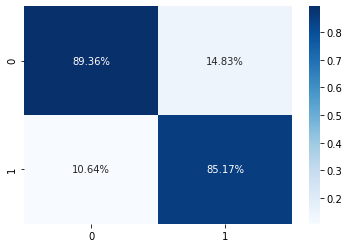

test Result:
CV - Accuracy : 0.79

CV - Precision: 0.79

CV - Recall: 0.79

CV - F1 score: 0.79

Confusion_matrix:
 [[697 198]
 [156 763]]

Classif_report:
               precision    recall  f1-score   support

           0       0.82      0.78      0.80       895
           1       0.79      0.83      0.81       919

    accuracy                           0.80      1814
   macro avg       0.81      0.80      0.80      1814
weighted avg       0.81      0.80      0.80      1814




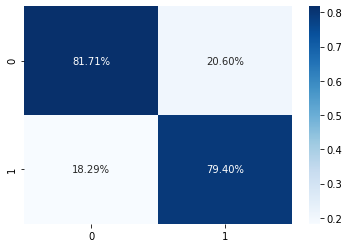

AUC score: 0.80


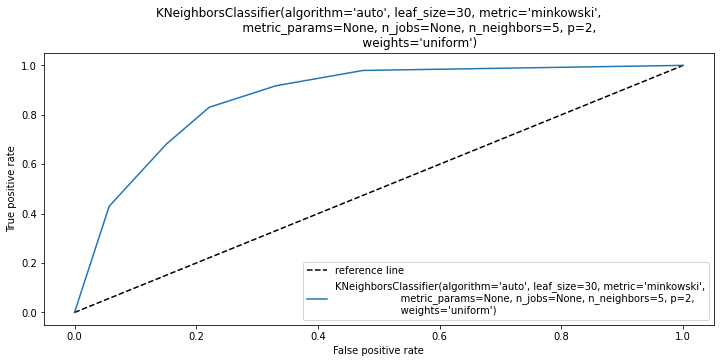

In [ ]:
print_scoresClassification(knn_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(knn_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Other Params:  Overfitting 0.90 vs 0.80

In [ ]:
knn_model3 = KNeighborsClassifier(n_neighbors=3)

knn_model3.fit(X_train_sca, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                     weights='uniform')

Train Result :
CV - Accuracy : 0.81

CV - Precision: 0.81

CV- Recall: 0.81

CV - F1 score: 0.81

Confusion_matrix:
 [[1461  201]
 [ 136 1569]]

Classif_report:
               precision    recall  f1-score   support

           0       0.91      0.88      0.90      1662
           1       0.89      0.92      0.90      1705

    accuracy                           0.90      3367
   macro avg       0.90      0.90      0.90      3367
weighted avg       0.90      0.90      0.90      3367




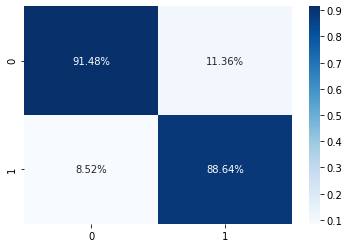

test Result:
CV - Accuracy : 0.78

CV - Precision: 0.78

CV - Recall: 0.78

CV - F1 score: 0.78

Confusion_matrix:
 [[689 206]
 [162 757]]

Classif_report:
               precision    recall  f1-score   support

           0       0.81      0.77      0.79       895
           1       0.79      0.82      0.80       919

    accuracy                           0.80      1814
   macro avg       0.80      0.80      0.80      1814
weighted avg       0.80      0.80      0.80      1814




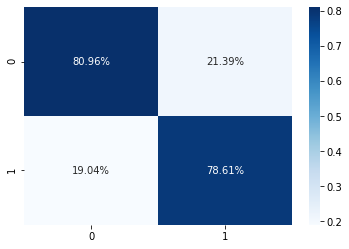

AUC score: 0.80


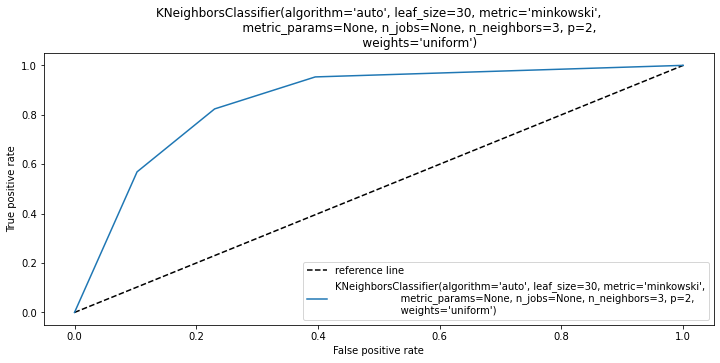

In [ ]:
print_scoresClassification(knn_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(knn_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)

## SVM

In [ ]:
from sklearn import svm
from sklearn.svm import SVC

### Choose params

In [ ]:
#define parameter grid
C_parameters = {'C' : [0.001, 0.01, 0.1, 1, 10, 100]}
#create grid search estimator
svc_grid_search = GridSearchCV(SVC(), param_grid=C_parameters, cv=5,return_train_score=True)

In [ ]:
#Train the model using the training sets 
svc_grid_search.fit(X_train_sca,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring=None, verbose=0)

In [ ]:
# Printing the best score and best parameters
print('Best score: %.2f using %s' % (svc_grid_search.best_score_,
    svc_grid_search.best_params_))
#print test score
print('Test score: {:.2f}'.format(svc_grid_search.score(X_test_sca, y_test)))

Best score: 0.82 using {'C': 10}
Test score: 0.81


In [ ]:
svc_model1 = svc_grid_search.best_estimator_
svc_model1.fit(X_train_sca, y_train)

SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

### Best Params - Error

In [ ]:
print_scoresClassification(svc_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(svc_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Other Params

In [ ]:
svc_model2 = SVC(C=0.001,probability=True)

svc_model2.fit(X_train_sca, y_train)

SVC(C=0.001, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

### Other Params: Error

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Pr

Train Result :
CV - Accuracy : 0.51

CV - Precision: 0.25

CV- Recall: 0.50

CV - F1 score: 0.34

Confusion_matrix:
 [[   0 1662]
 [   0 1705]]

Classif_report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00      1662
           1       0.51      1.00      0.67      1705

    accuracy                           0.51      3367
   macro avg       0.25      0.50      0.34      3367
weighted avg       0.26      0.51      0.34      3367




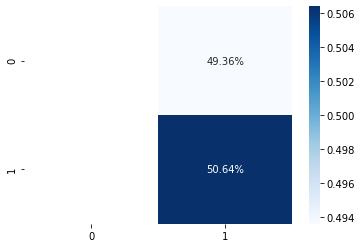

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Pr

test Result:
CV - Accuracy : 0.51

CV - Precision: 0.25

CV - Recall: 0.50

CV - F1 score: 0.34

Confusion_matrix:
 [[  0 895]
 [  0 919]]

Classif_report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       895
           1       0.51      1.00      0.67       919

    accuracy                           0.51      1814
   macro avg       0.25      0.50      0.34      1814
weighted avg       0.26      0.51      0.34      1814




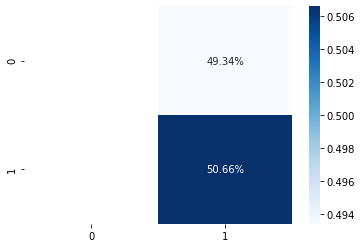

AUC score: 0.50


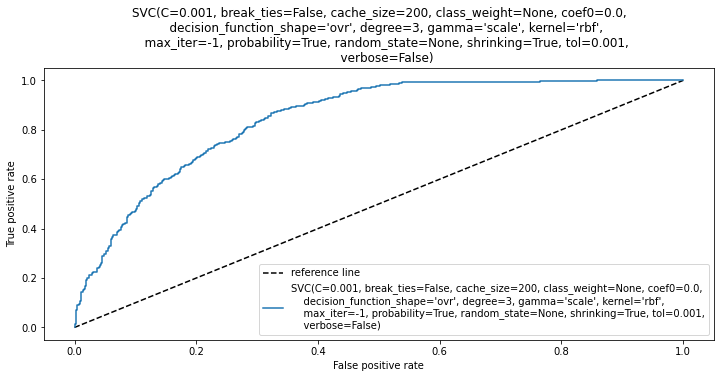

In [ ]:
print_scoresClassification(svc_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(svc_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

In [ ]:
svc_model3 = SVC(C=10,probability=True)

svc_model3.fit(X_train_sca, y_train)

SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

# Chosen Models

## ML - Two Classes




Logistic Model1, Score is high for both test and train, overfitting is not that high, cm is 20% for each class

### Model1: Analyse results - Slightly Overfitting 0.82 vs 0.80, Class 1 is better than Class 0

Train Result :
CV - Accuracy : 0.81

CV - Precision: 0.82

CV- Recall: 0.81

CV - F1 score: 0.81

Confusion_matrix:
 [[1267  395]
 [ 222 1483]]

Classif_report:
               precision    recall  f1-score   support

           0       0.85      0.76      0.80      1662
           1       0.79      0.87      0.83      1705

    accuracy                           0.82      3367
   macro avg       0.82      0.82      0.82      3367
weighted avg       0.82      0.82      0.82      3367




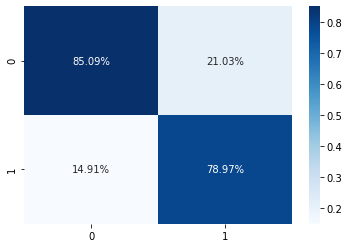

test Result:
CV - Accuracy : 0.79

CV - Precision: 0.80

CV - Recall: 0.79

CV - F1 score: 0.79

Confusion_matrix:
 [[677 218]
 [141 778]]

Classif_report:
               precision    recall  f1-score   support

           0       0.83      0.76      0.79       895
           1       0.78      0.85      0.81       919

    accuracy                           0.80      1814
   macro avg       0.80      0.80      0.80      1814
weighted avg       0.80      0.80      0.80      1814




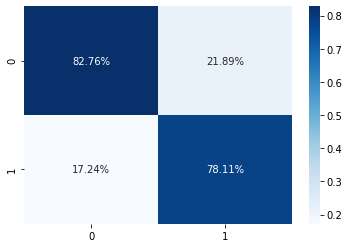

AUC score: 0.80


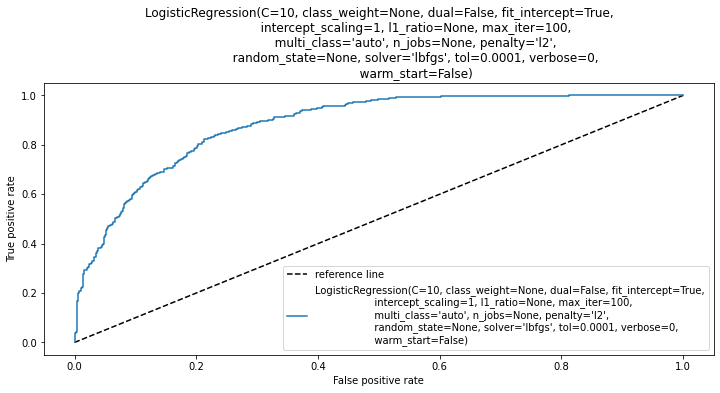

In [ ]:
print_scoresClassification(logreg_model1, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(logreg_model1, X_train_sca, y_train, X_test_sca, y_test, train=False)

## ML - Three Classes

SVM Model2, although score is not good but there is No overfitting

Random Forest Model3,better score than SVM but a bit overfitting

### Model2: Analyse results - No overfitting 0.63 but the accuracy for class 1 is very low 0.52

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Pr

Train Result :
CV - Accuracy : 0.55

CV - Precision: 0.48

CV- Recall: 0.55

CV - F1 score: 0.50

Confusion_matrix:
 [[1017  507  138]
 [ 128  919  615]
 [  38  446 1178]]

Classif_report:
               precision    recall  f1-score   support

           0       0.86      0.61      0.71      1662
           1       0.49      0.55      0.52      1662
           2       0.61      0.71      0.66      1662

    accuracy                           0.62      4986
   macro avg       0.65      0.62      0.63      4986
weighted avg       0.65      0.62      0.63      4986




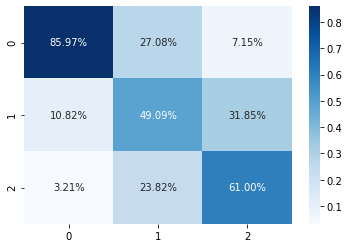

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Pr

test Result:
CV - Accuracy : 0.44

CV - Precision: 0.25

CV - Recall: 0.44

CV - F1 score: 0.30

Confusion_matrix:
 [[563 264  68]
 [ 76 486 333]
 [ 23 237 635]]

Classif_report:
               precision    recall  f1-score   support

           0       0.85      0.63      0.72       895
           1       0.49      0.54      0.52       895
           2       0.61      0.71      0.66       895

    accuracy                           0.63      2685
   macro avg       0.65      0.63      0.63      2685
weighted avg       0.65      0.63      0.63      2685




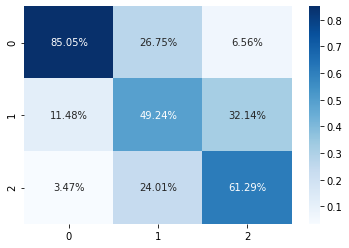

In [ ]:
print_scoresClassification(svc_model2, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(svc_model2, X_train_sca, y_train, X_test_sca, y_test, train=False)

### Model3: Analyse results - Slightly Overfitting 0.67 vs 0.64 but the accuracy for class 1 is very low 0.5

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    1.5s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent work

Train Result :
CV - Accuracy : 0.65

CV - Precision: 0.68

CV- Recall: 0.65

CV - F1 score: 0.65

Confusion_matrix:
 [[1073  477  112]
 [  98  930  634]
 [   8  361 1293]]

Classif_report:
               precision    recall  f1-score   support

           0       0.91      0.65      0.76      1662
           1       0.53      0.56      0.54      1662
           2       0.63      0.78      0.70      1662

    accuracy                           0.66      4986
   macro avg       0.69      0.66      0.67      4986
weighted avg       0.69      0.66      0.67      4986




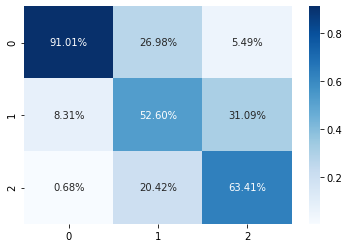

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.0s
[Parallel(n_jobs=2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0

test Result:
CV - Accuracy : 0.64

CV - Precision: 0.67

CV - Recall: 0.64

CV - F1 score: 0.64

Confusion_matrix:
 [[481 344  70]
 [ 18 470 407]
 [  0 176 719]]

Classif_report:
               precision    recall  f1-score   support

           0       0.96      0.54      0.69       895
           1       0.47      0.53      0.50       895
           2       0.60      0.80      0.69       895

    accuracy                           0.62      2685
   macro avg       0.68      0.62      0.63      2685
weighted avg       0.68      0.62      0.63      2685




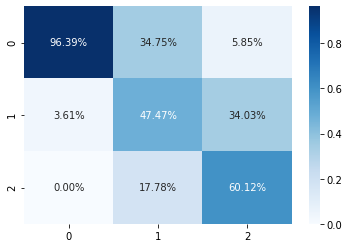

In [ ]:
print_scoresClassification(rf_model3, X_train_sca, y_train, X_test_sca, y_test, train=True)
print_scoresClassification(rf_model3, X_train_sca, y_train, X_test_sca, y_test, train=False)